In [2]:
#5개 지역 데이터 파일 영어로 변환
import pandas as pd

# 처리할 파일
file_paths = [
    './Merged_Station_403.xlsx',
    './Merged_Station_408.xlsx',
    './Merged_Station_423.xlsx',
    './Merged_Station_510.xlsx',
    './Merged_Station_889.xlsx'
]

# 컬럼명을 영어로 매핑하는 딕셔너리
column_mapping = {
    '지점': 'Point',
    '지점명': 'Point name',
    '일시': 'Timestamp',
    '기온(°C)': 'Temp',
    '풍향(deg)': 'Wind Direction',
    '풍속(m/s)': 'Wind Speed',
    '강수량(mm)': 'Precipitation',
    '수온': 'Water Temp',
    'pH': 'pH',
    '용존산소(㎎/L)': 'DO',
    '총질소(㎎/L)': 'TN',
    '총인(㎎/L)': 'TP',
    '총유기탄소': 'TOC'
}

# 각 파일을 처리하여 저장
output_paths = {}
for file_path in file_paths:
    # 데이터 불러오기
    data = pd.read_excel(file_path)
    
    # 컬럼명 변경
    data.rename(columns=column_mapping, inplace=True)
    
    # 변경된 파일 저장
    output_file_path = file_path.replace('Merged_Station', 'English_Station')
    data.to_excel(output_file_path, index=False)
    
    # 저장된 파일 경로 저장
    output_paths[file_path] = output_file_path



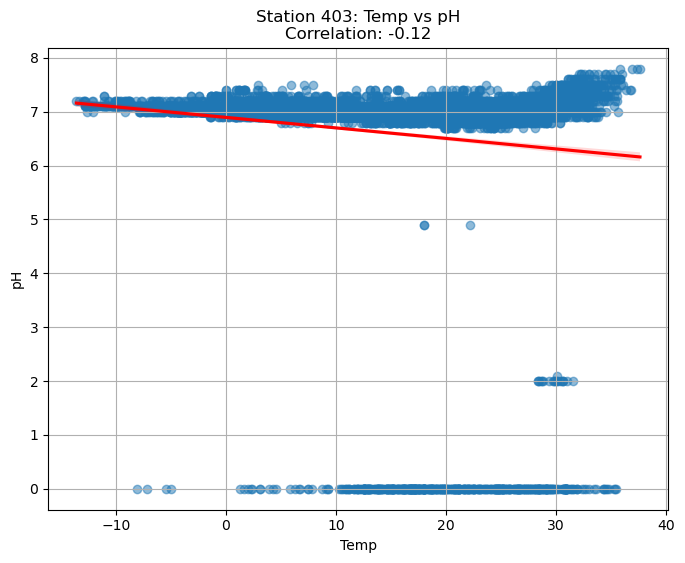

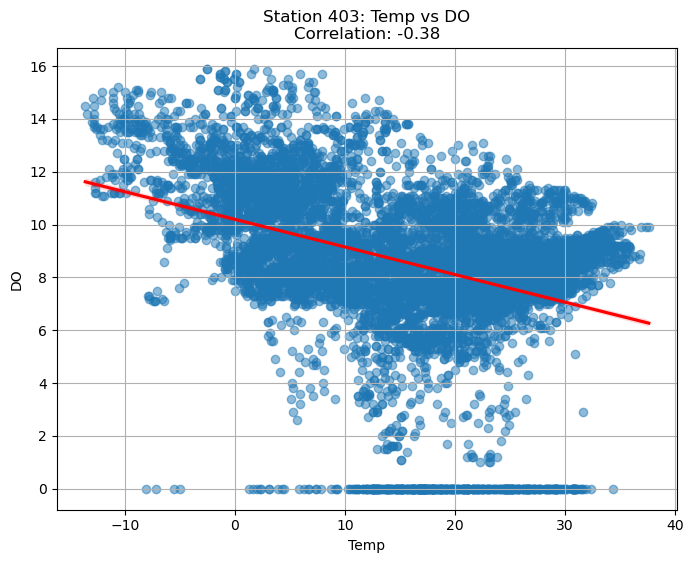

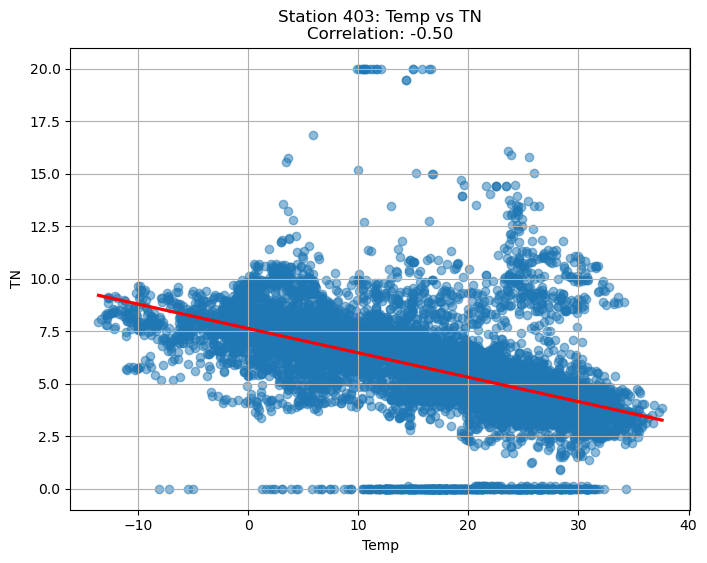

/opt/anaconda3/lib/python3.12/site-packages/numpy/lib/function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/opt/anaconda3/lib/python3.12/site-packages/numpy/lib/function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


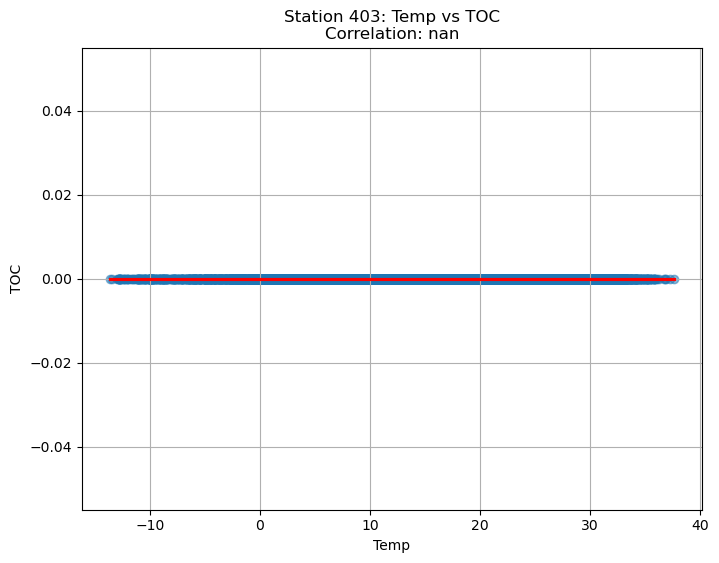

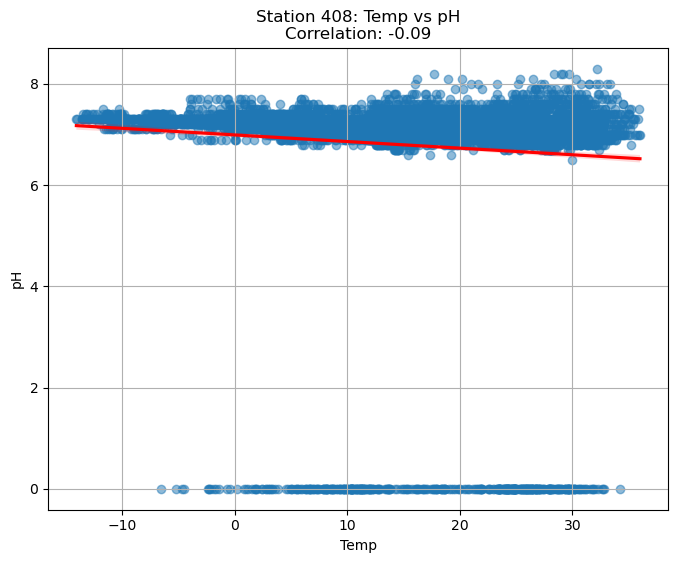

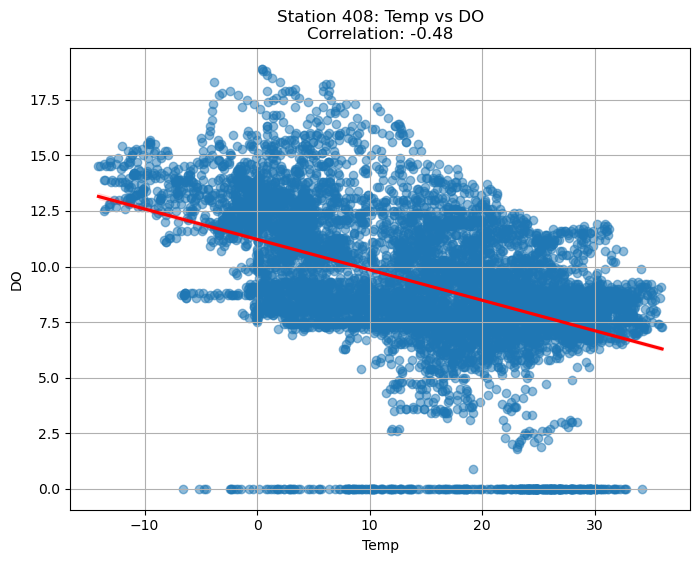

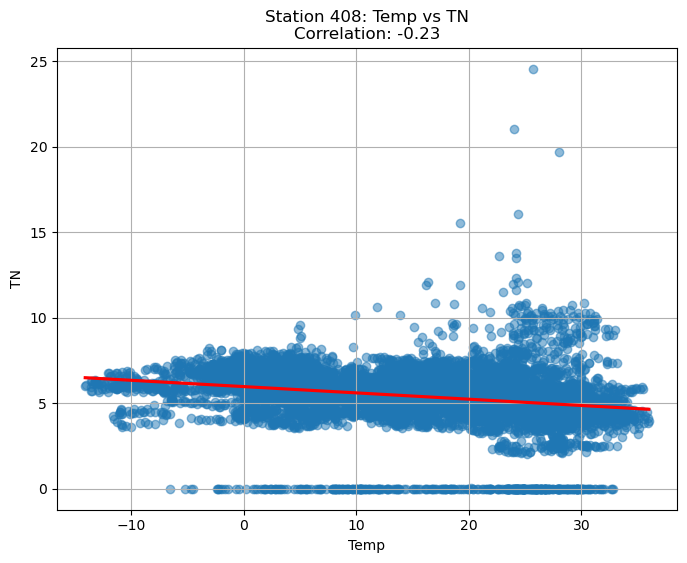

/opt/anaconda3/lib/python3.12/site-packages/numpy/lib/function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/opt/anaconda3/lib/python3.12/site-packages/numpy/lib/function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


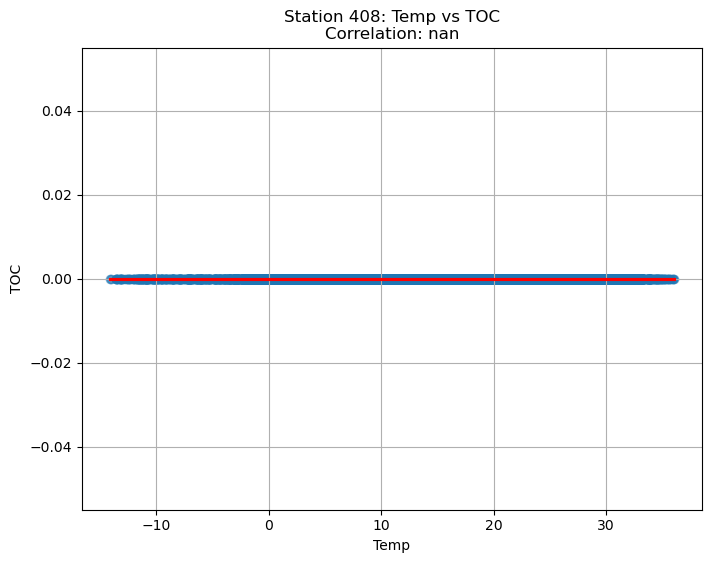

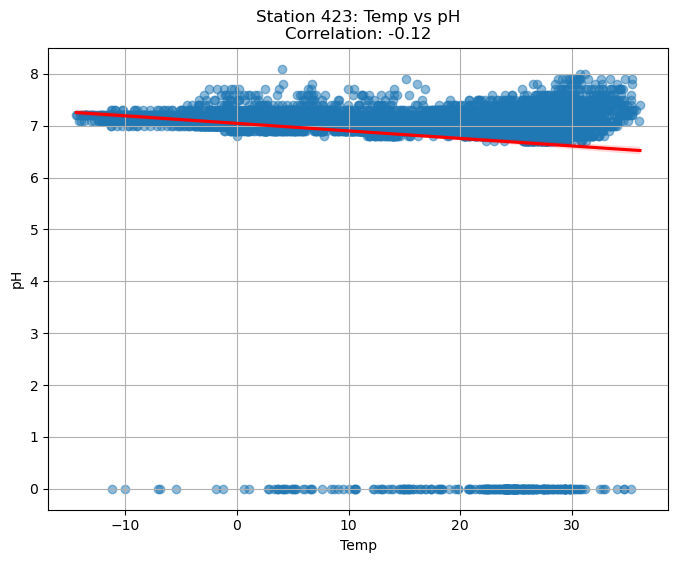

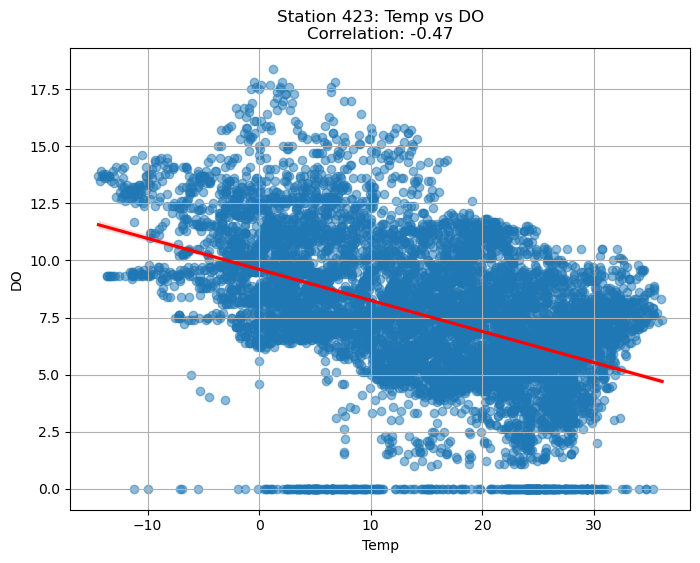

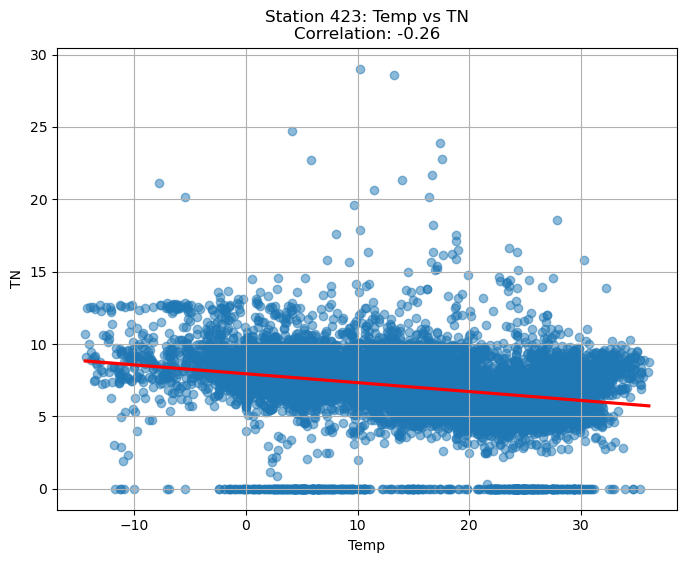

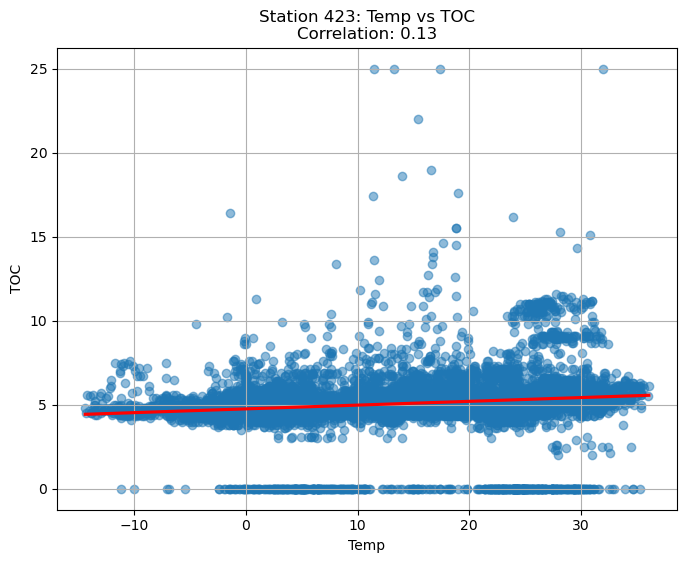

...

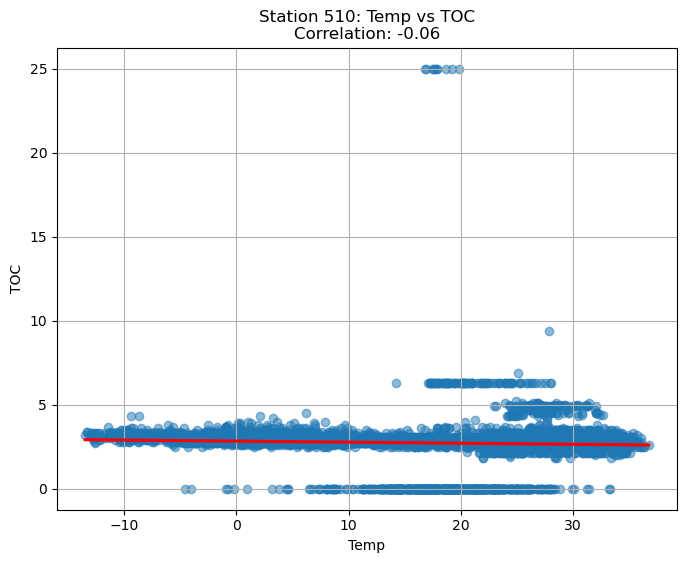

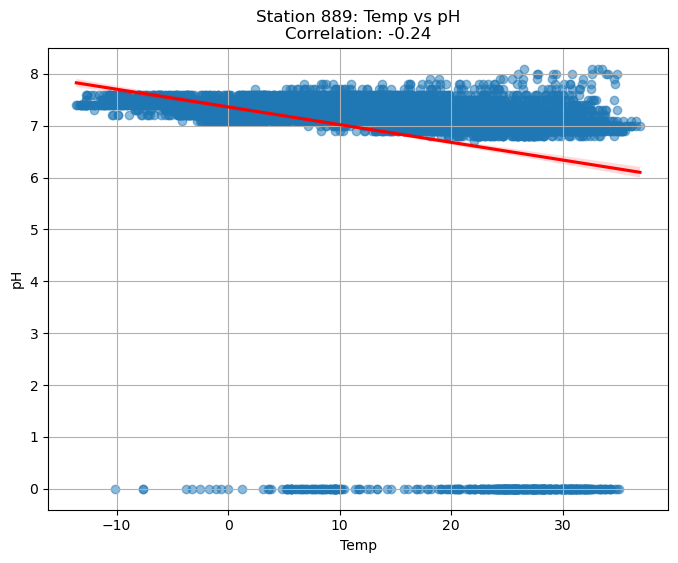

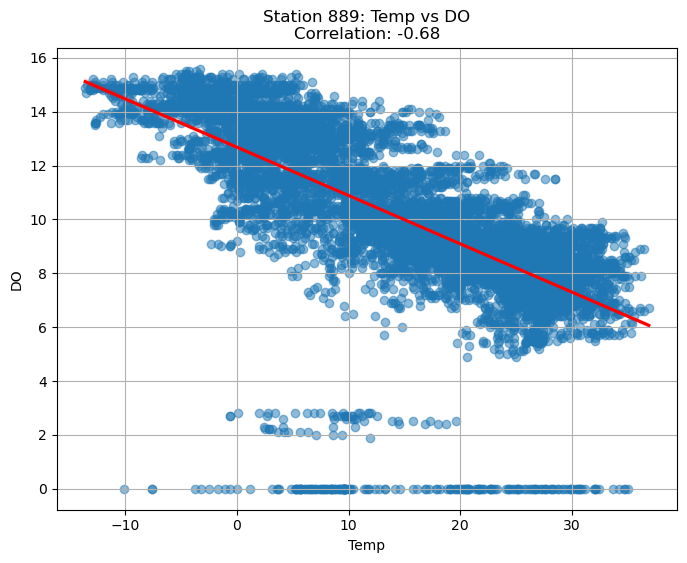

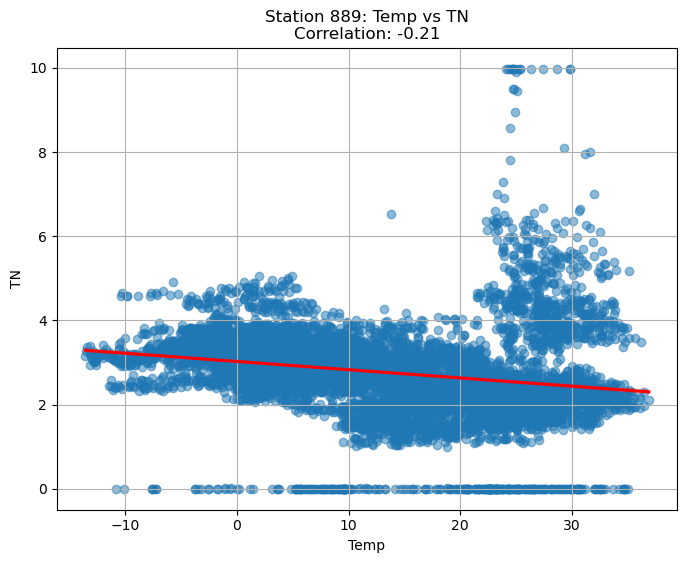

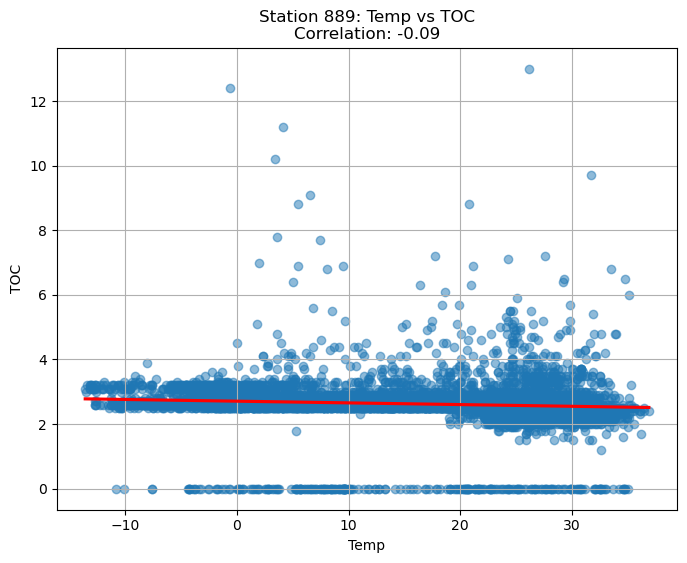

상관계수 결과: {('403', 'pH'): -0.1238119372079681, ('403', 'DO'): -0.3786531387706735, ('403', 'TN'): -0.5006739968231503, ('403', 'TOC'): nan, ('408', 'pH'): -0.0890210331981406, ('408', 'DO'): -0.47722762508054295, ('408', 'TN'): -0.2333958571381701, ('408', 'TOC'): nan, ('423', 'pH'): -0.12427508805455179, ('423', 'DO'): -0.46502567773056325, ('423', 'TN'): -0.25857998080288036, ('423', 'TOC'): 0.13205228508087763, ('510', 'pH'): -0.10467854771775711, ('510', 'DO'): -0.5704557208762898, ('510', 'TN'): -0.34031704734250984, ('510', 'TOC'): -0.05542672450357408, ('889', 'pH'): -0.2354236790022397, ('889', 'DO'): -0.684029272083657, ('889', 'TN'): -0.2052799092484966, ('889', 'TOC'): -0.08836312643467194}


In [2]:
#기온에 따른 'pH', 'DO', 'TN', 'TOC' 상관관계


import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns


file_paths = [
    './English_Station_403.xlsx',
    './English_Station_408.xlsx',
    './English_Station_423.xlsx',
    './English_Station_510.xlsx',
    './English_Station_889.xlsx'
]

# 상관관계를 계산할 대상
target_columns = ['pH', 'DO', 'TN', 'TOC']
temp_column = 'Temp'
correlation_results = {}

# for 문으로 5번 실행
for file_path in file_paths:
    
    station_data = pd.read_excel(file_path)
    
    # 5개 파일을 여러번 처리해야하므로 English_Station_403.xlsx 이란 파일을 _와 . 을 기준으로 
    # 나누어서 차이점이 403 이런 숫자만 있다는 것을 판단하여 코드 간결화
    station_name = file_path.split('_')[-1].split('.')[0]
    
    # 상관계수 및 그래프 생성
    for target in target_columns:
        # 상관계수 계산
        corr_value = station_data[temp_column].corr(station_data[target])
        correlation_results[(station_name, target)] = corr_value
        
        # 산점도 및 회귀선 시각화
        plt.figure(figsize=(8, 6))
        sns.regplot(x=temp_column, y=target, data=station_data, scatter_kws={'alpha': 0.5}, line_kws={'color': 'red'})
        plt.title(f'Station {station_name}: {temp_column} vs {target}\nCorrelation: {corr_value:.2f}')
        plt.xlabel(temp_column)
        plt.ylabel(target)
        plt.grid(True)
        plt.show()

# 상관관계 결과
print("상관계수 결과:", correlation_results)


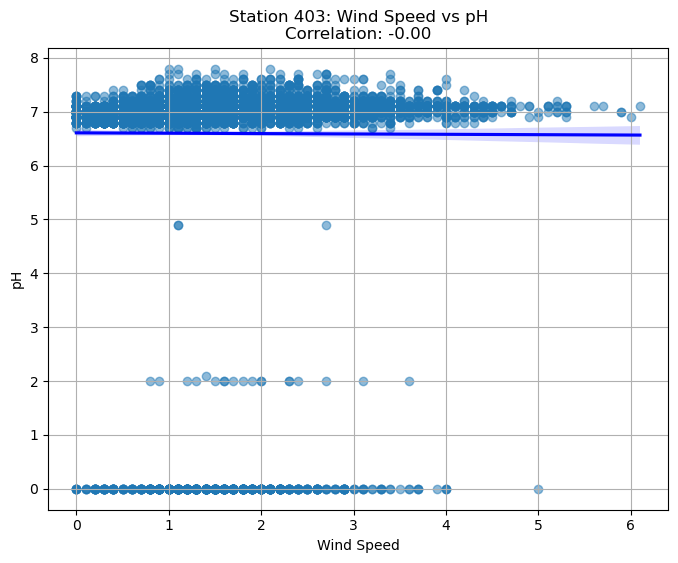

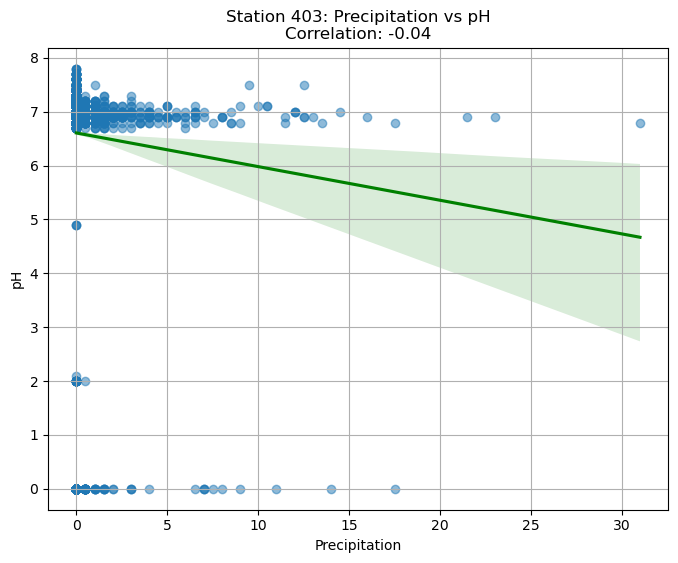

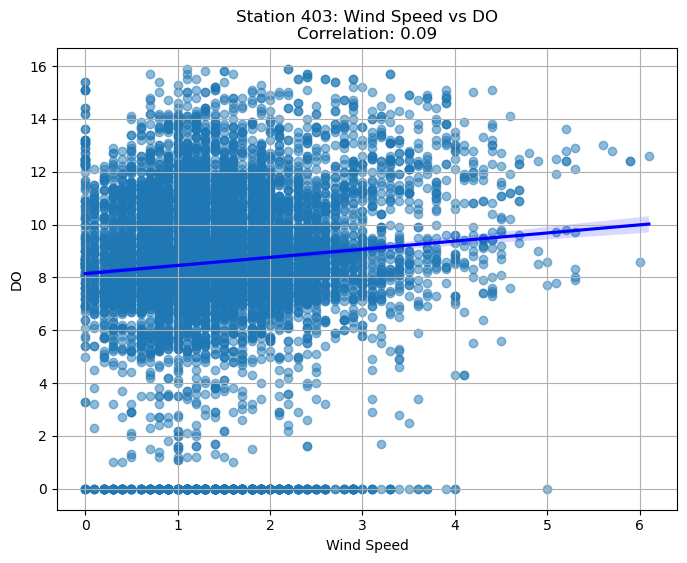

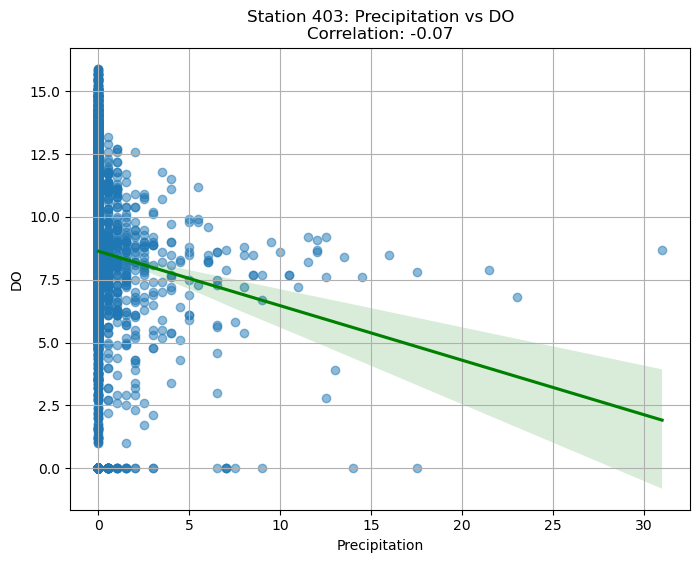

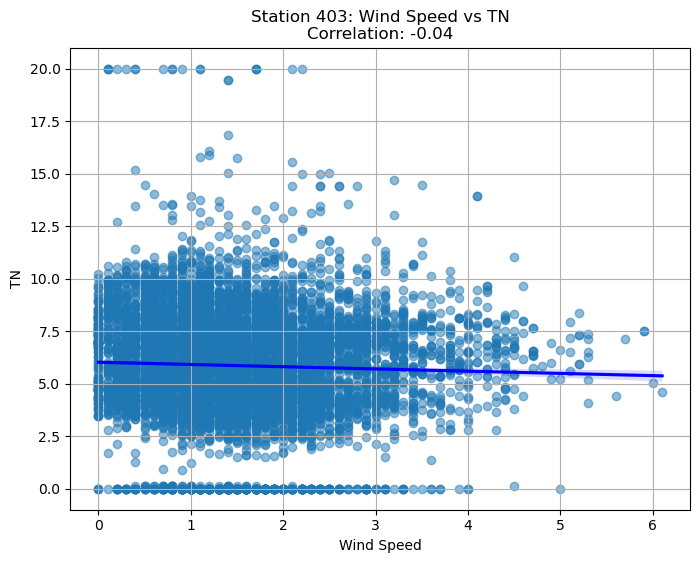

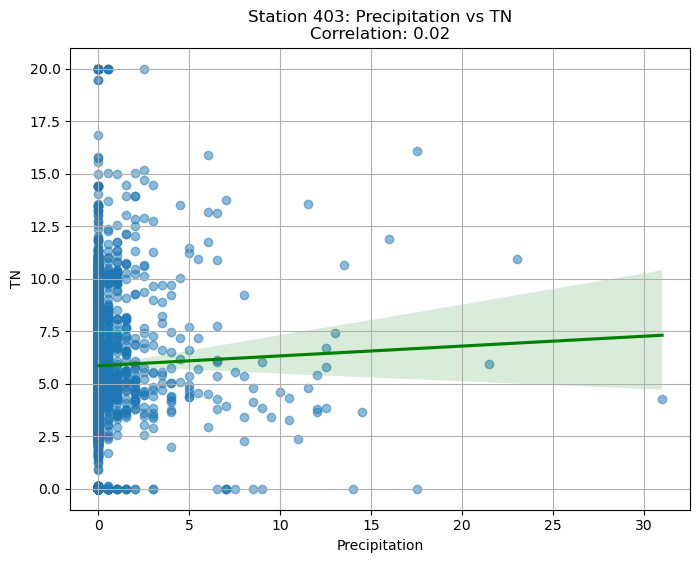

/opt/anaconda3/lib/python3.12/site-packages/numpy/lib/function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/opt/anaconda3/lib/python3.12/site-packages/numpy/lib/function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


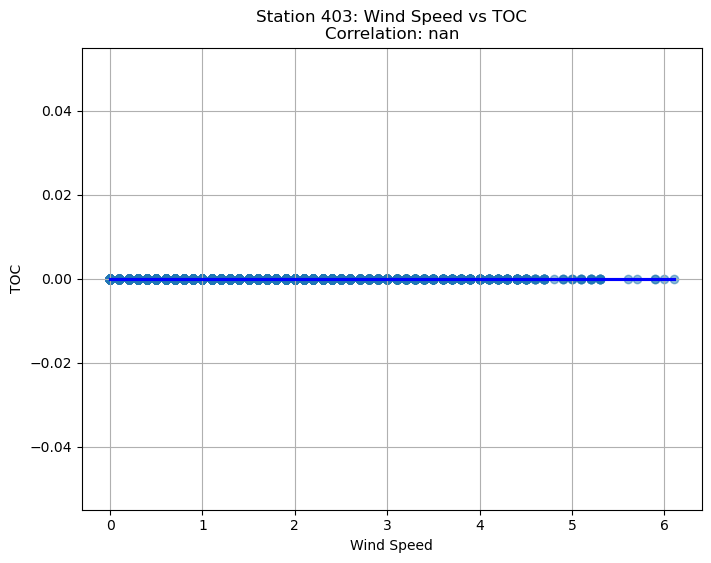

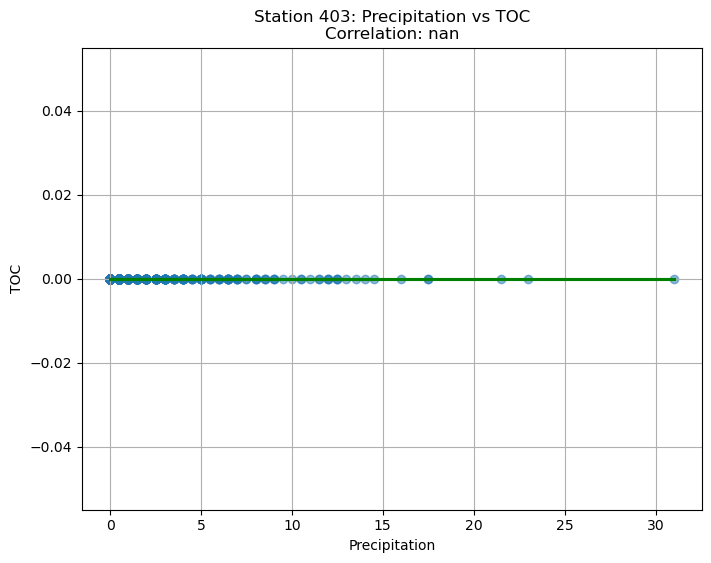

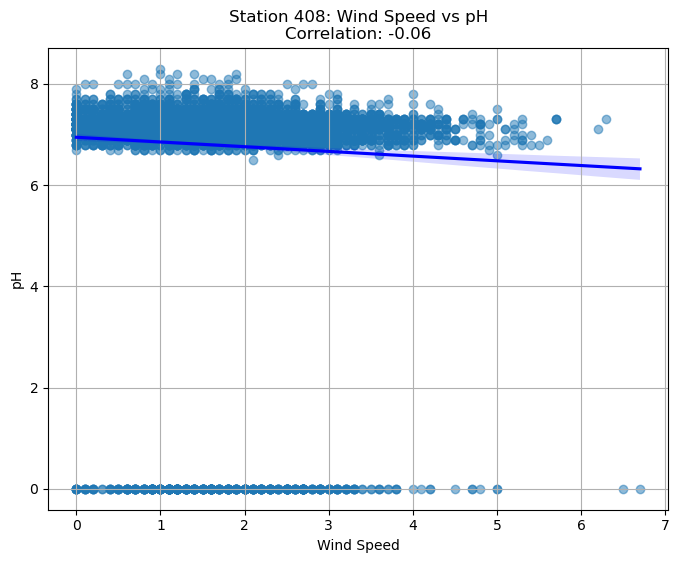

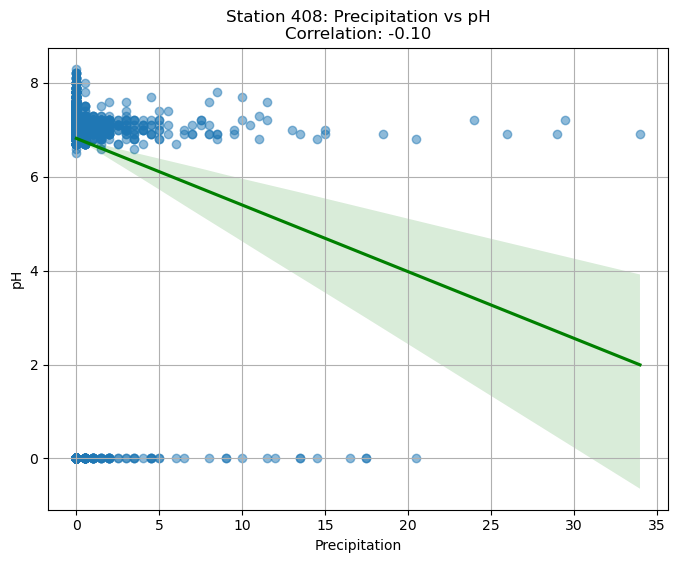

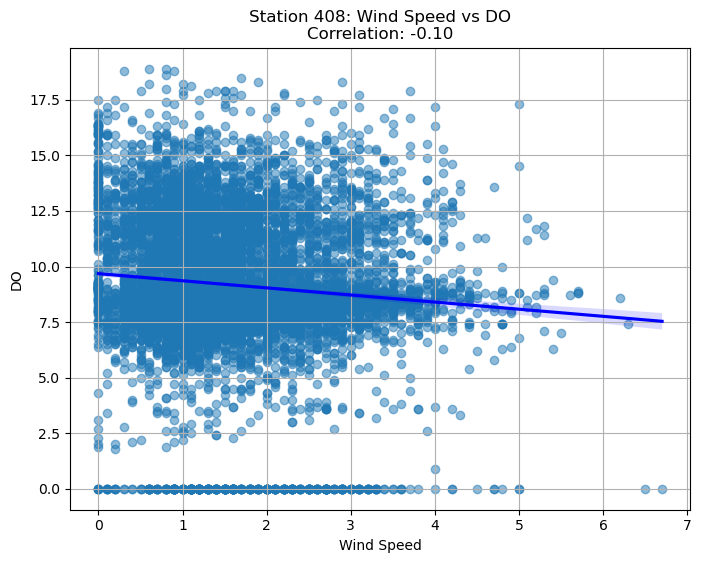

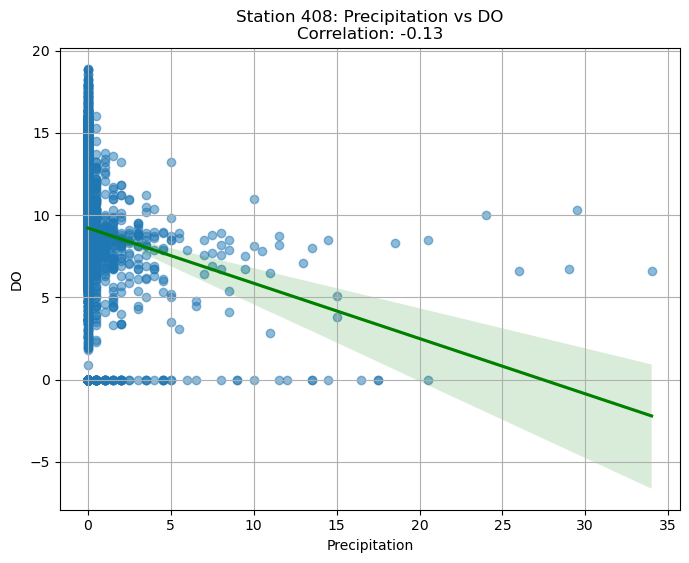

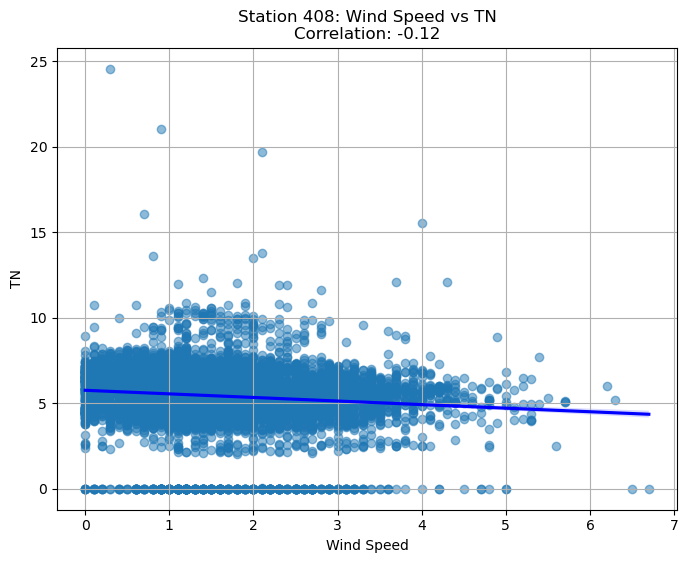

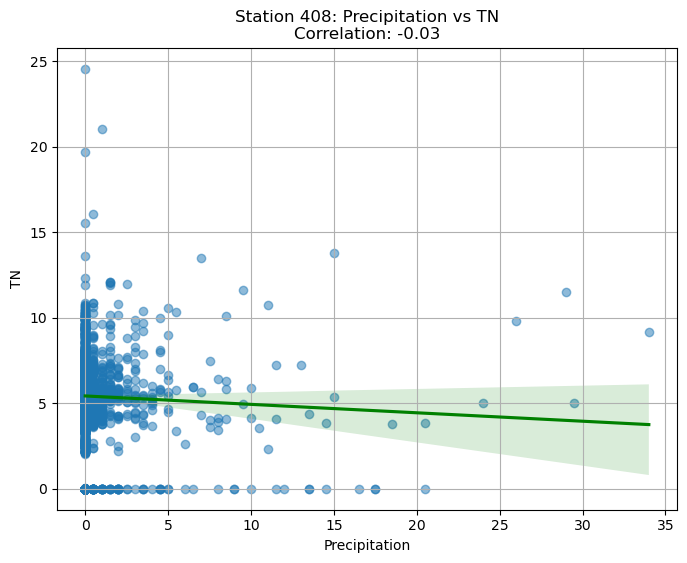

/opt/anaconda3/lib/python3.12/site-packages/numpy/lib/function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/opt/anaconda3/lib/python3.12/site-packages/numpy/lib/function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


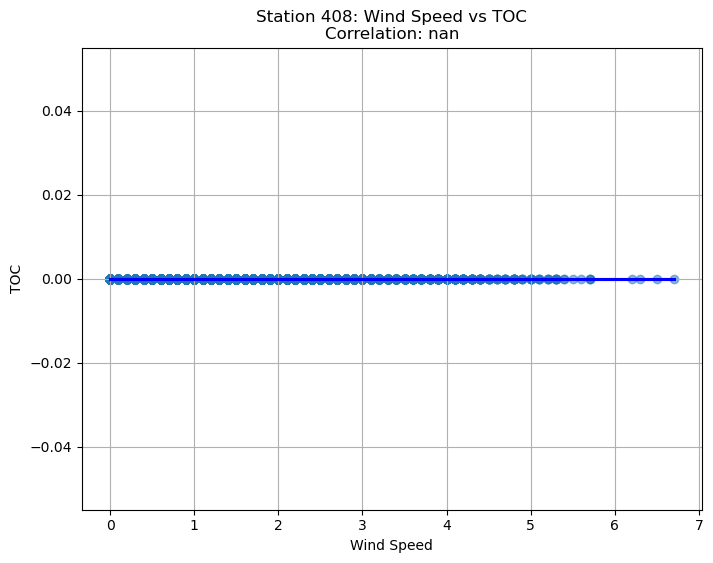

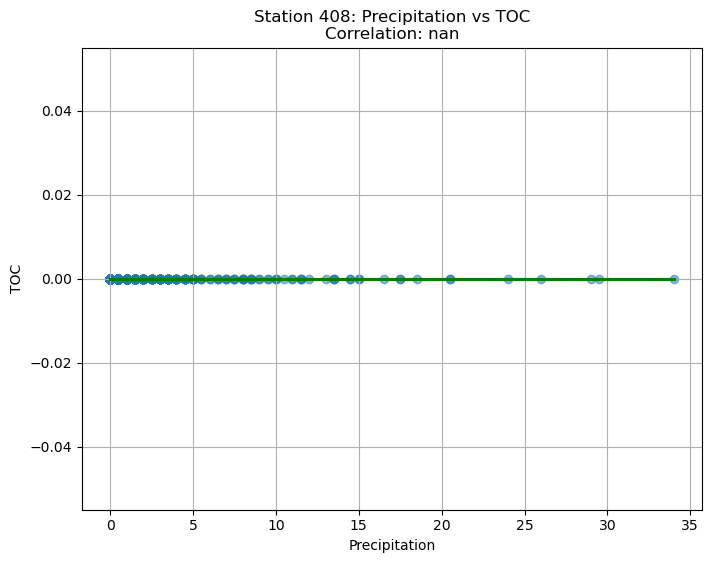

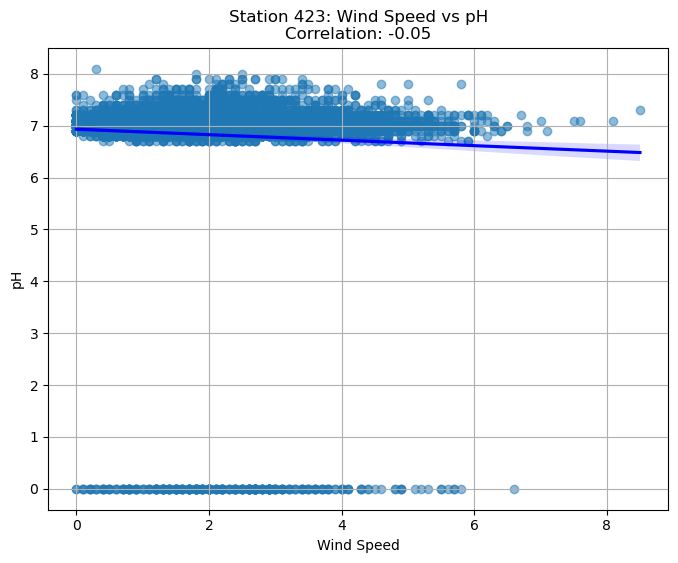

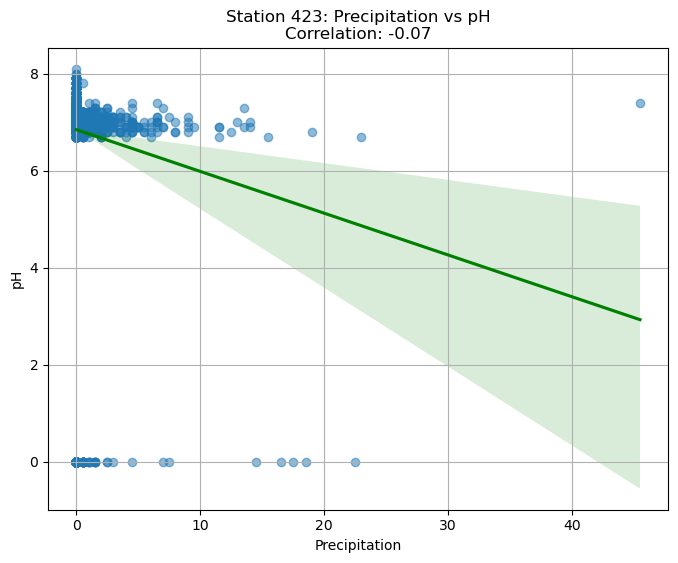

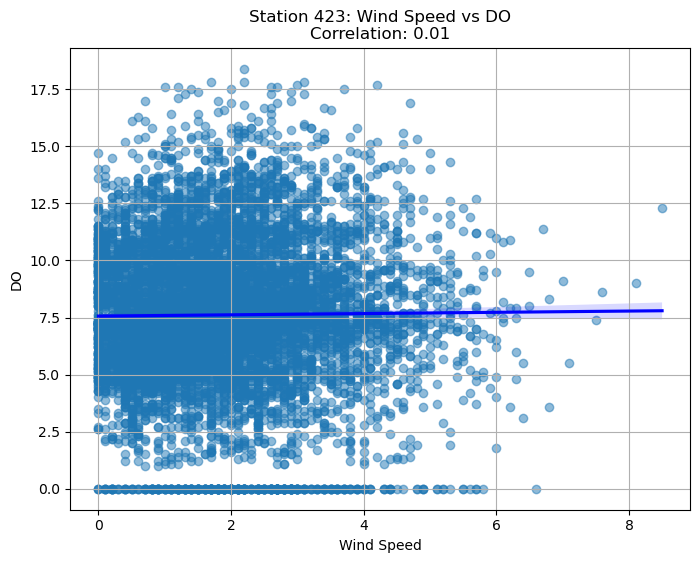

...

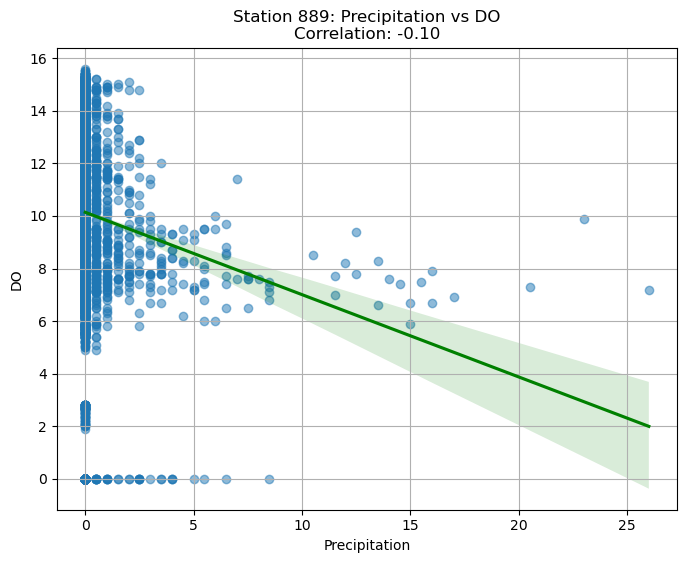

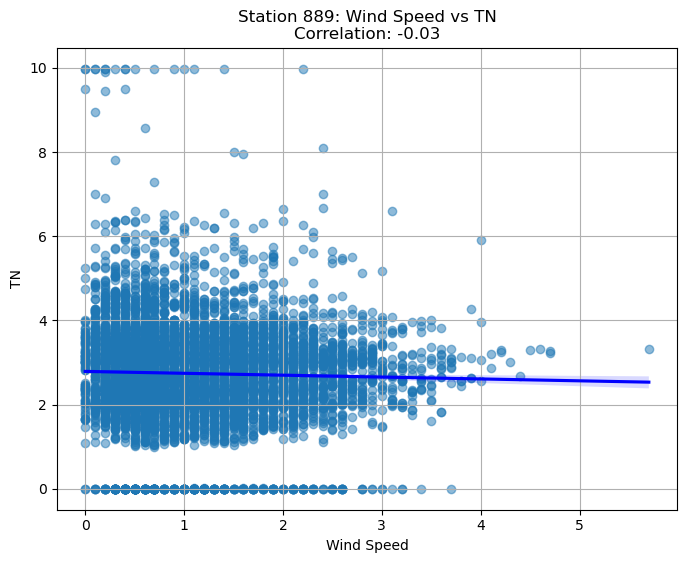

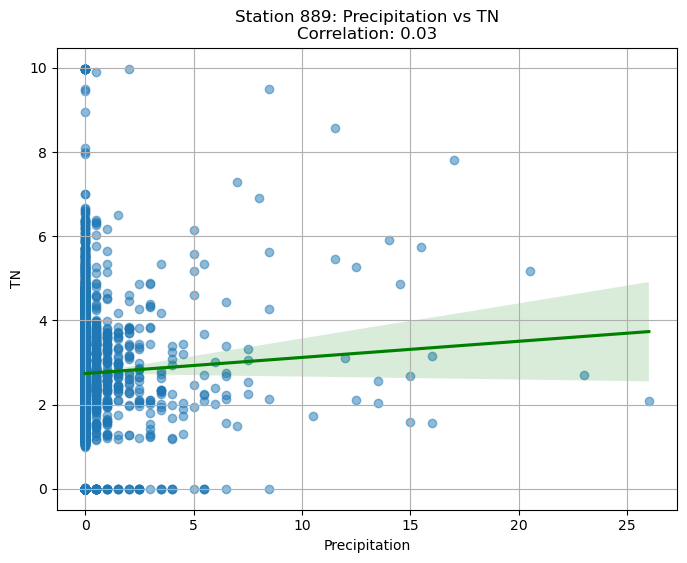

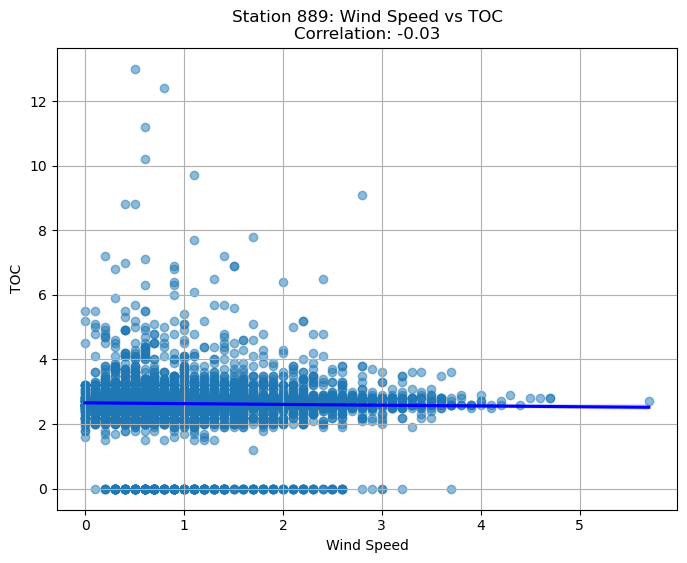

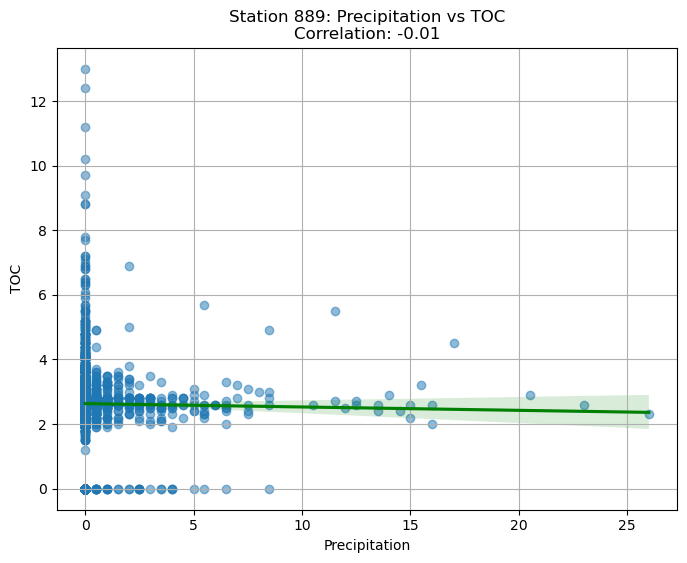

상관계수 결과: {('403', 'pH'): -0.1238119372079681, ('403', 'DO'): -0.3786531387706735, ('403', 'TN'): -0.5006739968231503, ('403', 'TOC'): nan, ('408', 'pH'): -0.0890210331981406, ('408', 'DO'): -0.47722762508054295, ('408', 'TN'): -0.2333958571381701, ('408', 'TOC'): nan, ('423', 'pH'): -0.12427508805455179, ('423', 'DO'): -0.46502567773056325, ('423', 'TN'): -0.25857998080288036, ('423', 'TOC'): 0.13205228508087763, ('510', 'pH'): -0.10467854771775711, ('510', 'DO'): -0.5704557208762898, ('510', 'TN'): -0.34031704734250984, ('510', 'TOC'): -0.05542672450357408, ('889', 'pH'): -0.2354236790022397, ('889', 'DO'): -0.684029272083657, ('889', 'TN'): -0.2052799092484966, ('889', 'TOC'): -0.08836312643467194}


In [4]:
#풍속, 강수량에 따른 'pH', 'DO', 'TN', 'TOC' 상관관계

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns


file_paths = [
    './English_Station_403.xlsx',
    './English_Station_408.xlsx',
    './English_Station_423.xlsx',
    './English_Station_510.xlsx',
    './English_Station_889.xlsx'
]


target_columns = ['pH', 'DO', 'TN', 'TOC']
wind_speed_column = 'Wind Speed'
precipitation_column = 'Precipitation'
correlation_results_wind_speed = {}
correlation_results_precipitation = {}


for file_path in file_paths:
    station_data = pd.read_excel(file_path)
    station_name = file_path.split('_')[-1].split('.')[0]
    
    # Wind Speed 상관관계 및 시각화
    for target in target_columns:
        corr_wind = station_data[wind_speed_column].corr(station_data[target])
        correlation_results_wind_speed[(station_name, target)] = corr_wind
        
        plt.figure(figsize=(8, 6))
        sns.regplot(x=wind_speed_column, y=target, data=station_data, scatter_kws={'alpha': 0.5}, line_kws={'color': 'blue'})
        plt.title(f'Station {station_name}: {wind_speed_column} vs {target}\nCorrelation: {corr_wind:.2f}')
        plt.xlabel(wind_speed_column)
        plt.ylabel(target)
        plt.grid(True)
        plt.show()

        # Precipitation 상관관계 및 시각화
        corr_precip = station_data[precipitation_column].corr(station_data[target])
        correlation_results_precipitation[(station_name, target)] = corr_precip
        
        plt.figure(figsize=(8, 6))
        sns.regplot(x=precipitation_column, y=target, data=station_data, scatter_kws={'alpha': 0.5}, line_kws={'color': 'green'})
        plt.title(f'Station {station_name}: {precipitation_column} vs {target}\nCorrelation: {corr_precip:.2f}')
        plt.xlabel(precipitation_column)
        plt.ylabel(target)
        plt.grid(True)
        plt.show()

# 상관관계 결과
print("상관계수 결과:", correlation_results)


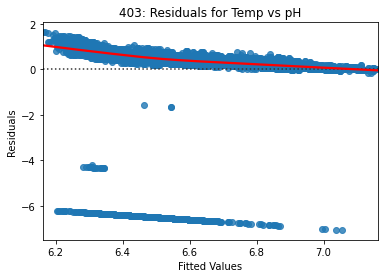

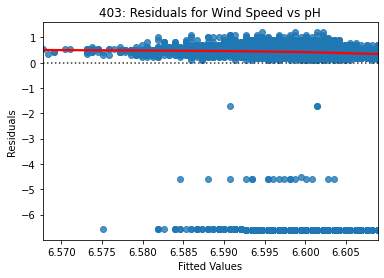

C:\Users\USER\anaconda3\lib\site-packages\statsmodels\nonparametric\smoothers_lowess.py:214: RuntimeWarning: invalid value encountered in true_divide
  res, _ = _lowess(y, x, x, np.ones_like(x),


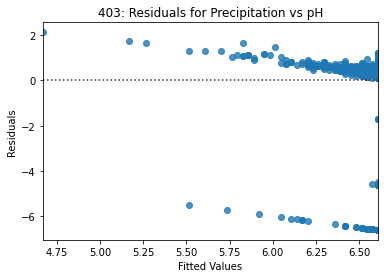

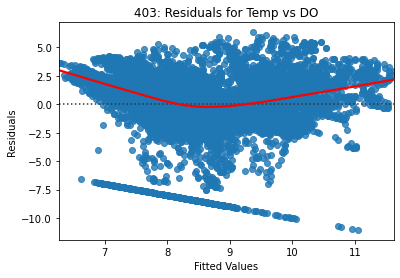

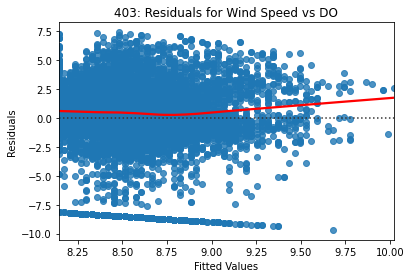

C:\Users\USER\anaconda3\lib\site-packages\statsmodels\nonparametric\smoothers_lowess.py:214: RuntimeWarning: invalid value encountered in true_divide
  res, _ = _lowess(y, x, x, np.ones_like(x),


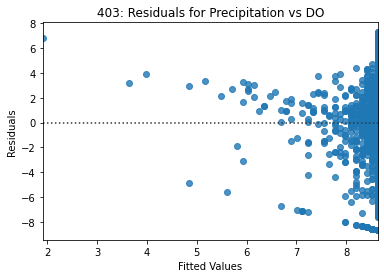

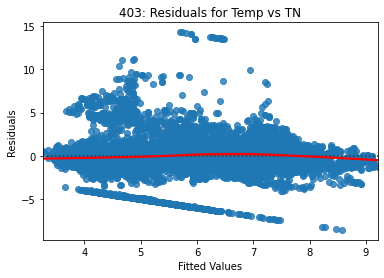

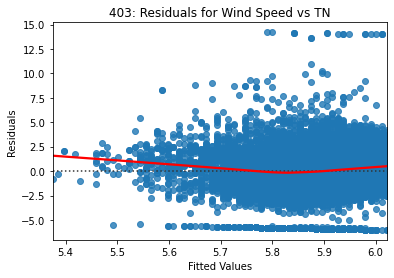

C:\Users\USER\anaconda3\lib\site-packages\statsmodels\nonparametric\smoothers_lowess.py:214: RuntimeWarning: invalid value encountered in true_divide
  res, _ = _lowess(y, x, x, np.ones_like(x),


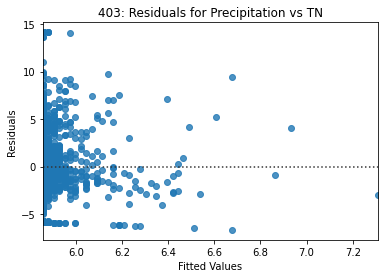

C:\Users\USER\anaconda3\lib\site-packages\statsmodels\regression\linear_model.py:1715: RuntimeWarning: invalid value encountered in double_scalars
  return 1 - self.ssr/self.centered_tss
C:\Users\USER\anaconda3\lib\site-packages\statsmodels\regression\linear_model.py:1804: RuntimeWarning: invalid value encountered in double_scalars
  return self.mse_model/self.mse_resid
C:\Users\USER\anaconda3\lib\site-packages\statsmodels\regression\linear_model.py:903: RuntimeWarning: divide by zero encountered in log
  llf = -nobs2*np.log(2*np.pi) - nobs2*np.log(ssr / nobs) - nobs2
C:\Users\USER\anaconda3\lib\site-packages\statsmodels\stats\stattools.py:50: RuntimeWarning: invalid value encountered in double_scalars
  dw = np.sum(diff_resids**2, axis=axis) / np.sum(resids**2, axis=axis)
C:\Users\USER\anaconda3\lib\site-packages\statsmodels\nonparametric\smoothers_lowess.py:214: RuntimeWarning: invalid value encountered in true_divide
  res, _ = _lowess(y, x, x, np.ones_like(x),


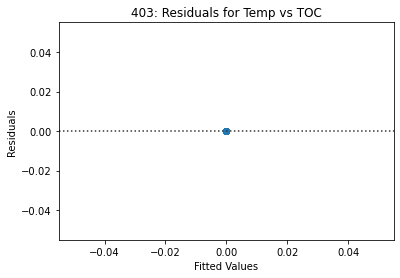

C:\Users\USER\anaconda3\lib\site-packages\statsmodels\regression\linear_model.py:1715: RuntimeWarning: invalid value encountered in double_scalars
  return 1 - self.ssr/self.centered_tss
C:\Users\USER\anaconda3\lib\site-packages\statsmodels\regression\linear_model.py:1804: RuntimeWarning: invalid value encountered in double_scalars
  return self.mse_model/self.mse_resid
C:\Users\USER\anaconda3\lib\site-packages\statsmodels\regression\linear_model.py:903: RuntimeWarning: divide by zero encountered in log
  llf = -nobs2*np.log(2*np.pi) - nobs2*np.log(ssr / nobs) - nobs2
C:\Users\USER\anaconda3\lib\site-packages\statsmodels\stats\stattools.py:50: RuntimeWarning: invalid value encountered in double_scalars
  dw = np.sum(diff_resids**2, axis=axis) / np.sum(resids**2, axis=axis)
C:\Users\USER\anaconda3\lib\site-packages\statsmodels\nonparametric\smoothers_lowess.py:214: RuntimeWarning: invalid value encountered in true_divide
  res, _ = _lowess(y, x, x, np.ones_like(x),


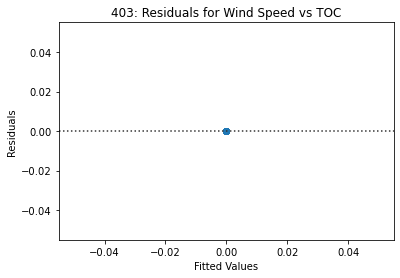

C:\Users\USER\anaconda3\lib\site-packages\statsmodels\regression\linear_model.py:1715: RuntimeWarning: invalid value encountered in double_scalars
  return 1 - self.ssr/self.centered_tss
C:\Users\USER\anaconda3\lib\site-packages\statsmodels\regression\linear_model.py:1804: RuntimeWarning: invalid value encountered in double_scalars
  return self.mse_model/self.mse_resid
C:\Users\USER\anaconda3\lib\site-packages\statsmodels\regression\linear_model.py:903: RuntimeWarning: divide by zero encountered in log
  llf = -nobs2*np.log(2*np.pi) - nobs2*np.log(ssr / nobs) - nobs2
C:\Users\USER\anaconda3\lib\site-packages\statsmodels\stats\stattools.py:50: RuntimeWarning: invalid value encountered in double_scalars
  dw = np.sum(diff_resids**2, axis=axis) / np.sum(resids**2, axis=axis)
C:\Users\USER\anaconda3\lib\site-packages\statsmodels\nonparametric\smoothers_lowess.py:214: RuntimeWarning: invalid value encountered in true_divide
  res, _ = _lowess(y, x, x, np.ones_like(x),


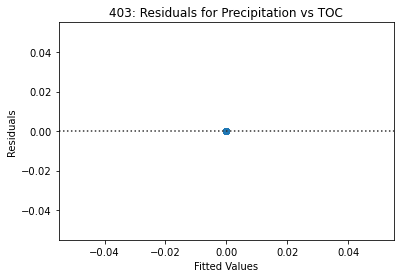

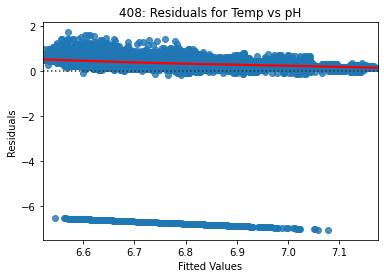

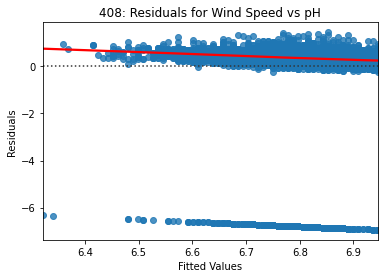

C:\Users\USER\anaconda3\lib\site-packages\statsmodels\nonparametric\smoothers_lowess.py:214: RuntimeWarning: invalid value encountered in true_divide
  res, _ = _lowess(y, x, x, np.ones_like(x),


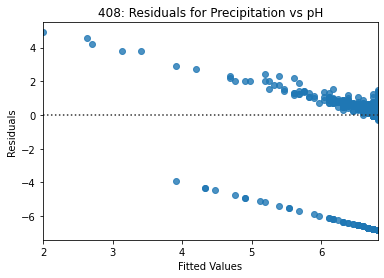

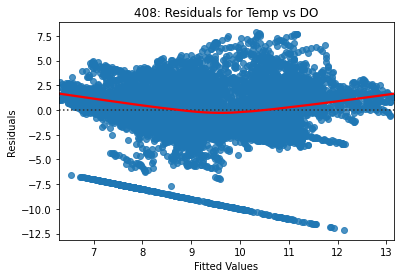

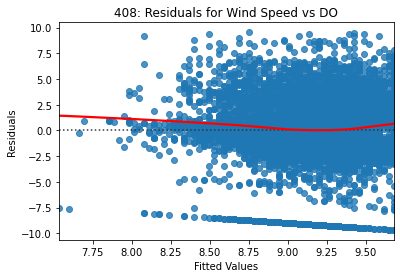

C:\Users\USER\anaconda3\lib\site-packages\statsmodels\nonparametric\smoothers_lowess.py:214: RuntimeWarning: invalid value encountered in true_divide
  res, _ = _lowess(y, x, x, np.ones_like(x),


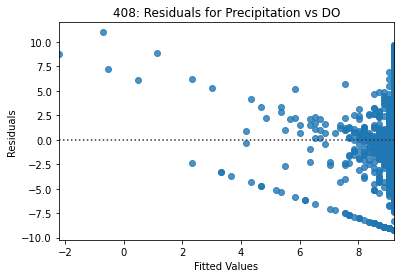

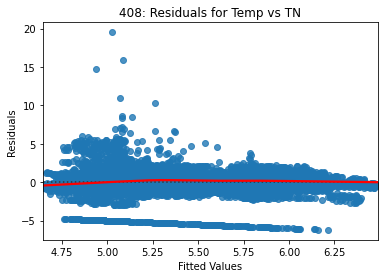

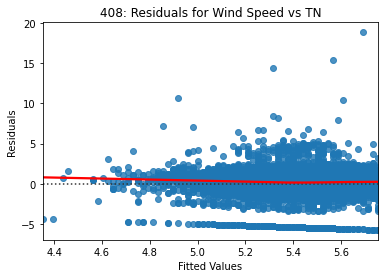

C:\Users\USER\anaconda3\lib\site-packages\statsmodels\nonparametric\smoothers_lowess.py:214: RuntimeWarning: invalid value encountered in true_divide
  res, _ = _lowess(y, x, x, np.ones_like(x),


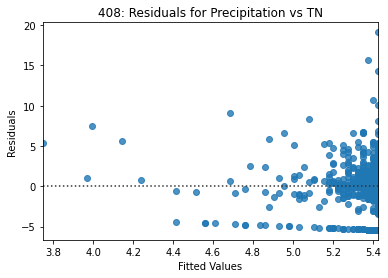

C:\Users\USER\anaconda3\lib\site-packages\statsmodels\regression\linear_model.py:1715: RuntimeWarning: invalid value encountered in double_scalars
  return 1 - self.ssr/self.centered_tss
C:\Users\USER\anaconda3\lib\site-packages\statsmodels\regression\linear_model.py:1804: RuntimeWarning: invalid value encountered in double_scalars
  return self.mse_model/self.mse_resid
C:\Users\USER\anaconda3\lib\site-packages\statsmodels\regression\linear_model.py:903: RuntimeWarning: divide by zero encountered in log
  llf = -nobs2*np.log(2*np.pi) - nobs2*np.log(ssr / nobs) - nobs2
C:\Users\USER\anaconda3\lib\site-packages\statsmodels\stats\stattools.py:50: RuntimeWarning: invalid value encountered in double_scalars
  dw = np.sum(diff_resids**2, axis=axis) / np.sum(resids**2, axis=axis)
C:\Users\USER\anaconda3\lib\site-packages\statsmodels\nonparametric\smoothers_lowess.py:214: RuntimeWarning: invalid value encountered in true_divide
  res, _ = _lowess(y, x, x, np.ones_like(x),


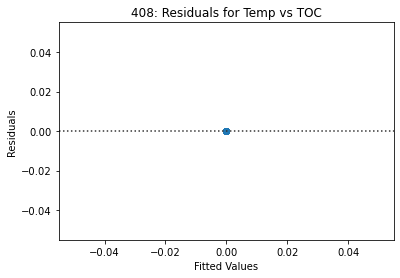

C:\Users\USER\anaconda3\lib\site-packages\statsmodels\regression\linear_model.py:1715: RuntimeWarning: invalid value encountered in double_scalars
  return 1 - self.ssr/self.centered_tss
C:\Users\USER\anaconda3\lib\site-packages\statsmodels\regression\linear_model.py:1804: RuntimeWarning: invalid value encountered in double_scalars
  return self.mse_model/self.mse_resid
C:\Users\USER\anaconda3\lib\site-packages\statsmodels\regression\linear_model.py:903: RuntimeWarning: divide by zero encountered in log
  llf = -nobs2*np.log(2*np.pi) - nobs2*np.log(ssr / nobs) - nobs2
C:\Users\USER\anaconda3\lib\site-packages\statsmodels\stats\stattools.py:50: RuntimeWarning: invalid value encountered in double_scalars
  dw = np.sum(diff_resids**2, axis=axis) / np.sum(resids**2, axis=axis)
C:\Users\USER\anaconda3\lib\site-packages\statsmodels\nonparametric\smoothers_lowess.py:214: RuntimeWarning: invalid value encountered in true_divide
  res, _ = _lowess(y, x, x, np.ones_like(x),


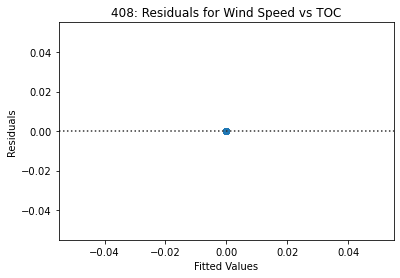

C:\Users\USER\anaconda3\lib\site-packages\statsmodels\regression\linear_model.py:1715: RuntimeWarning: invalid value encountered in double_scalars
  return 1 - self.ssr/self.centered_tss
C:\Users\USER\anaconda3\lib\site-packages\statsmodels\regression\linear_model.py:1804: RuntimeWarning: invalid value encountered in double_scalars
  return self.mse_model/self.mse_resid
C:\Users\USER\anaconda3\lib\site-packages\statsmodels\regression\linear_model.py:903: RuntimeWarning: divide by zero encountered in log
  llf = -nobs2*np.log(2*np.pi) - nobs2*np.log(ssr / nobs) - nobs2
C:\Users\USER\anaconda3\lib\site-packages\statsmodels\stats\stattools.py:50: RuntimeWarning: invalid value encountered in double_scalars
  dw = np.sum(diff_resids**2, axis=axis) / np.sum(resids**2, axis=axis)
C:\Users\USER\anaconda3\lib\site-packages\statsmodels\nonparametric\smoothers_lowess.py:214: RuntimeWarning: invalid value encountered in true_divide
  res, _ = _lowess(y, x, x, np.ones_like(x),


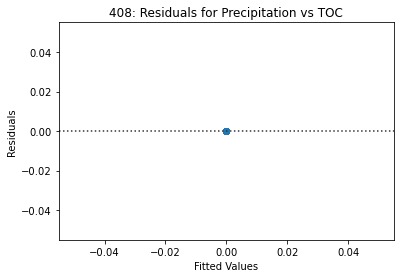

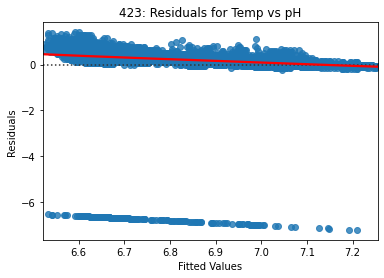

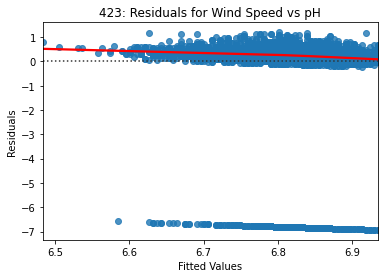

C:\Users\USER\anaconda3\lib\site-packages\statsmodels\nonparametric\smoothers_lowess.py:214: RuntimeWarning: invalid value encountered in true_divide
  res, _ = _lowess(y, x, x, np.ones_like(x),


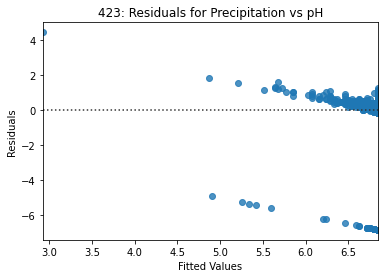

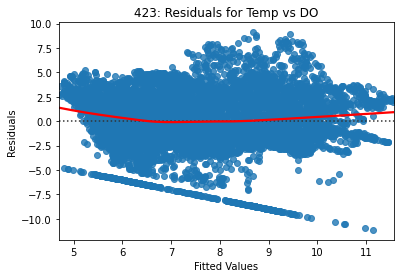

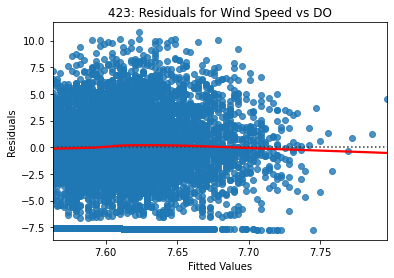

C:\Users\USER\anaconda3\lib\site-packages\statsmodels\nonparametric\smoothers_lowess.py:214: RuntimeWarning: invalid value encountered in true_divide
  res, _ = _lowess(y, x, x, np.ones_like(x),


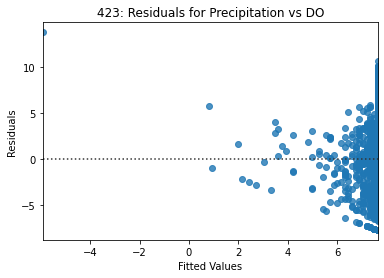

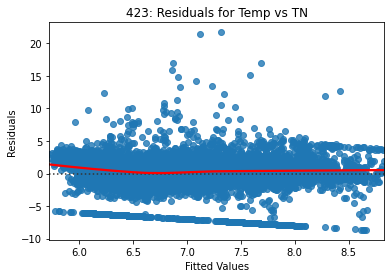

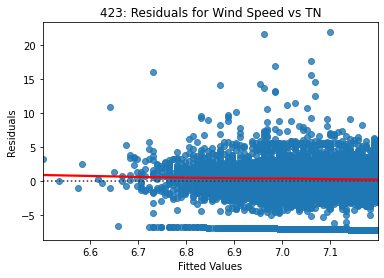

C:\Users\USER\anaconda3\lib\site-packages\statsmodels\nonparametric\smoothers_lowess.py:214: RuntimeWarning: invalid value encountered in true_divide
  res, _ = _lowess(y, x, x, np.ones_like(x),


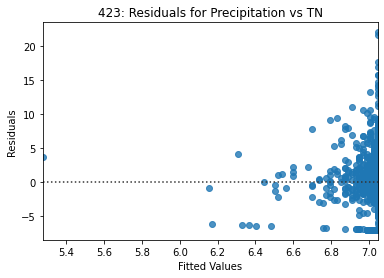

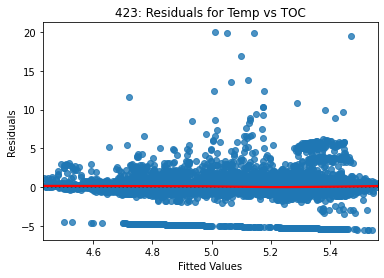

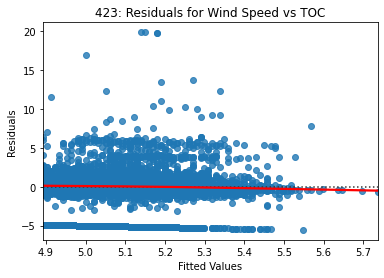

C:\Users\USER\anaconda3\lib\site-packages\statsmodels\nonparametric\smoothers_lowess.py:214: RuntimeWarning: invalid value encountered in true_divide
  res, _ = _lowess(y, x, x, np.ones_like(x),


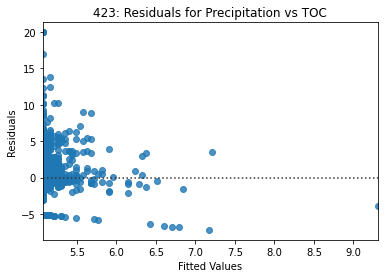

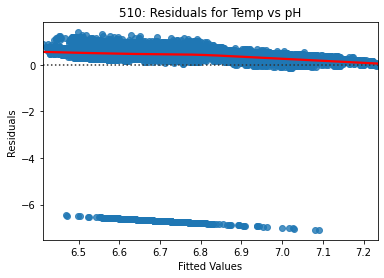

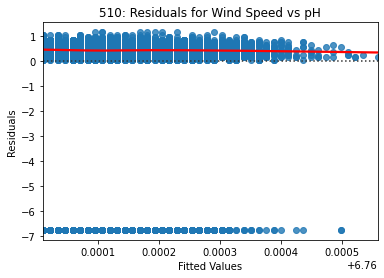

C:\Users\USER\anaconda3\lib\site-packages\statsmodels\nonparametric\smoothers_lowess.py:214: RuntimeWarning: invalid value encountered in true_divide
  res, _ = _lowess(y, x, x, np.ones_like(x),


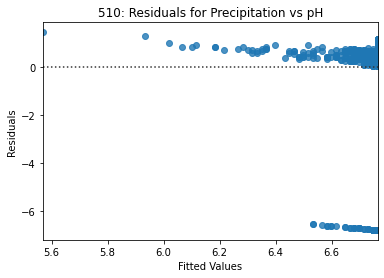

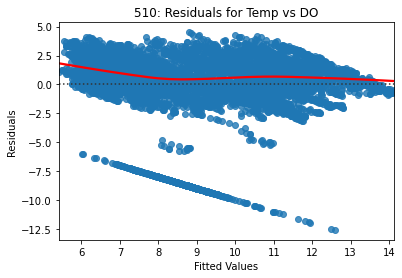

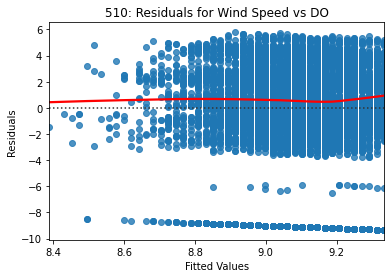

C:\Users\USER\anaconda3\lib\site-packages\statsmodels\nonparametric\smoothers_lowess.py:214: RuntimeWarning: invalid value encountered in true_divide
  res, _ = _lowess(y, x, x, np.ones_like(x),


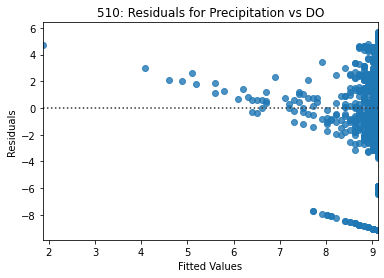

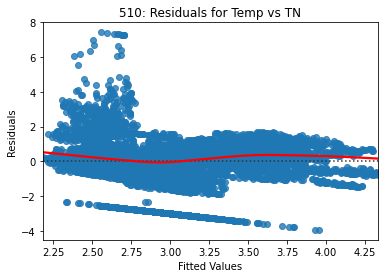

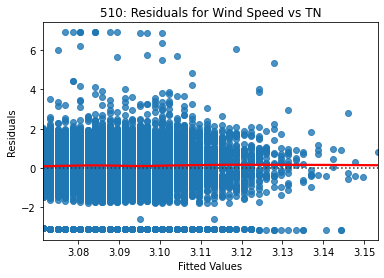

C:\Users\USER\anaconda3\lib\site-packages\statsmodels\nonparametric\smoothers_lowess.py:214: RuntimeWarning: invalid value encountered in true_divide
  res, _ = _lowess(y, x, x, np.ones_like(x),


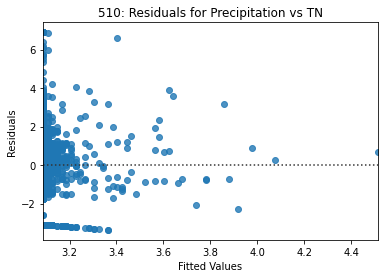

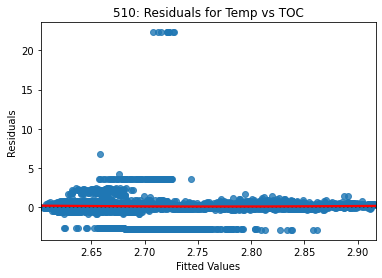

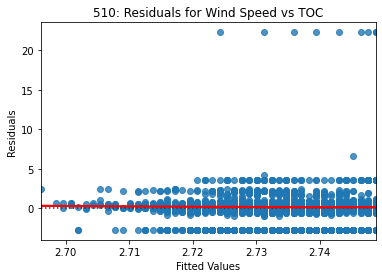

C:\Users\USER\anaconda3\lib\site-packages\statsmodels\nonparametric\smoothers_lowess.py:214: RuntimeWarning: invalid value encountered in true_divide
  res, _ = _lowess(y, x, x, np.ones_like(x),


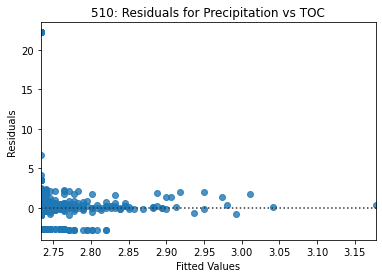

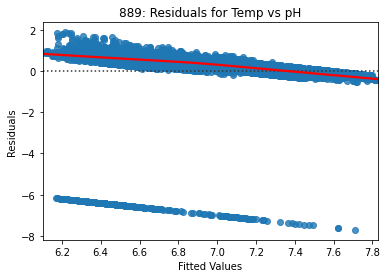

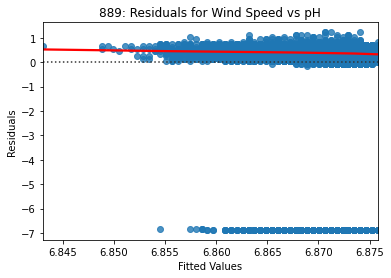

C:\Users\USER\anaconda3\lib\site-packages\statsmodels\nonparametric\smoothers_lowess.py:214: RuntimeWarning: invalid value encountered in true_divide
  res, _ = _lowess(y, x, x, np.ones_like(x),


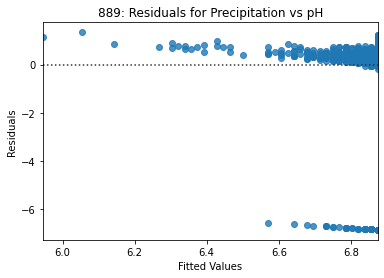

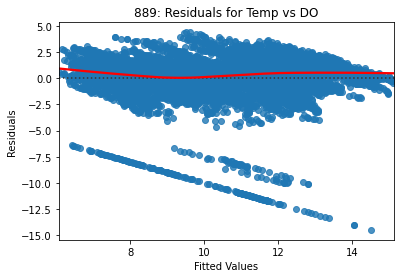

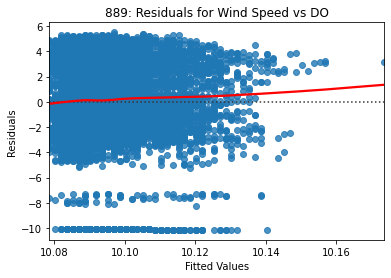

C:\Users\USER\anaconda3\lib\site-packages\statsmodels\nonparametric\smoothers_lowess.py:214: RuntimeWarning: invalid value encountered in true_divide
  res, _ = _lowess(y, x, x, np.ones_like(x),


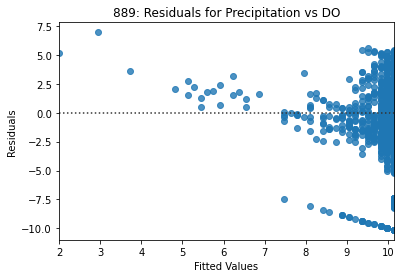

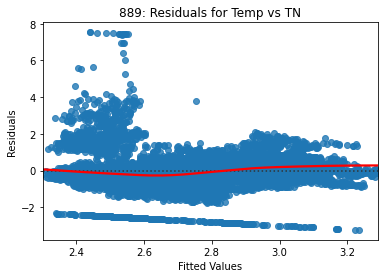

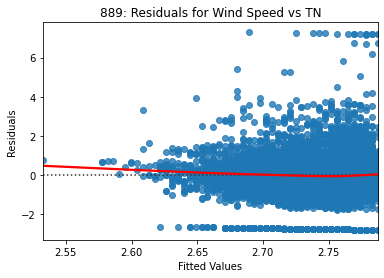

C:\Users\USER\anaconda3\lib\site-packages\statsmodels\nonparametric\smoothers_lowess.py:214: RuntimeWarning: invalid value encountered in true_divide
  res, _ = _lowess(y, x, x, np.ones_like(x),


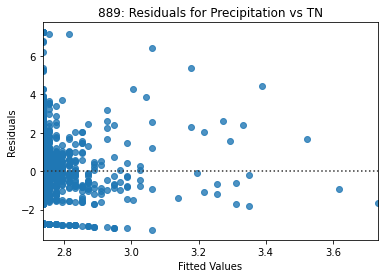

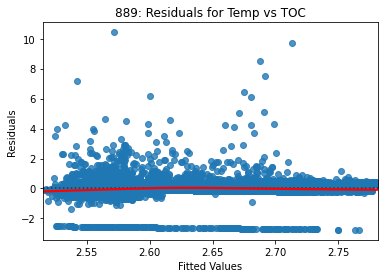

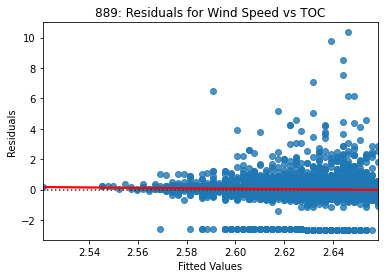

C:\Users\USER\anaconda3\lib\site-packages\statsmodels\nonparametric\smoothers_lowess.py:214: RuntimeWarning: invalid value encountered in true_divide
  res, _ = _lowess(y, x, x, np.ones_like(x),


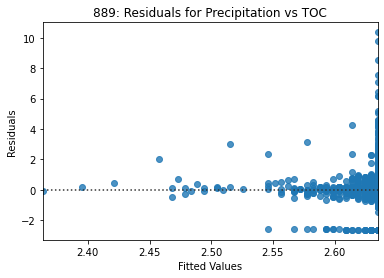

### 최종


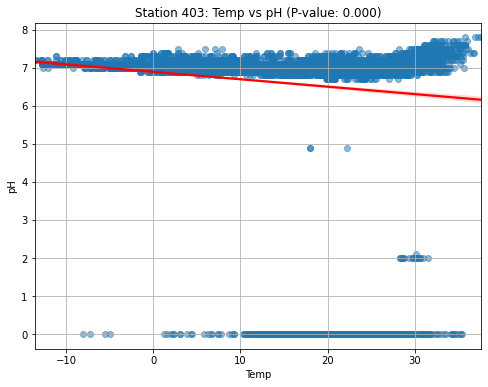

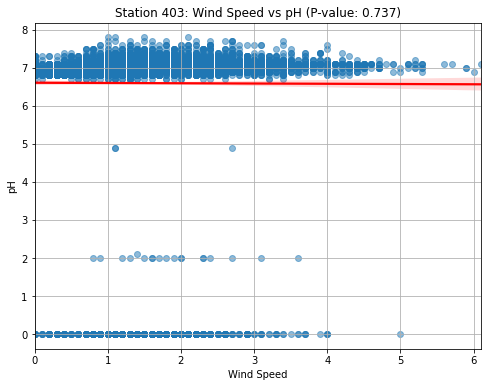

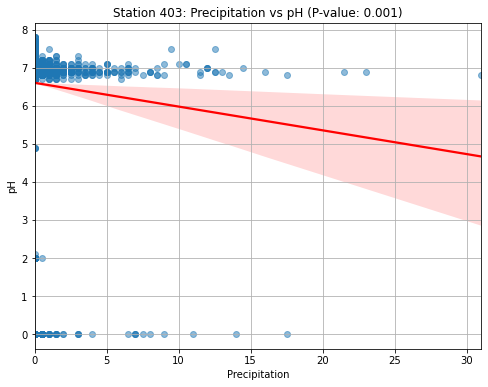

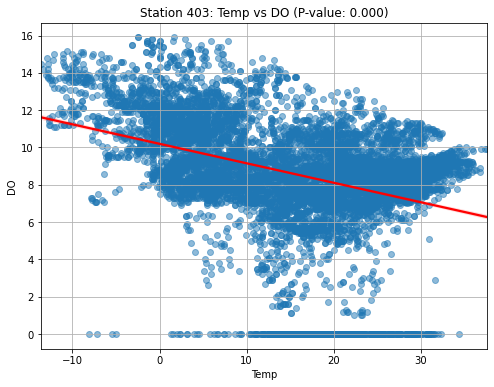

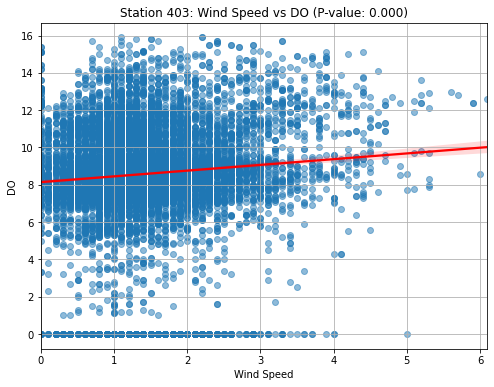

...

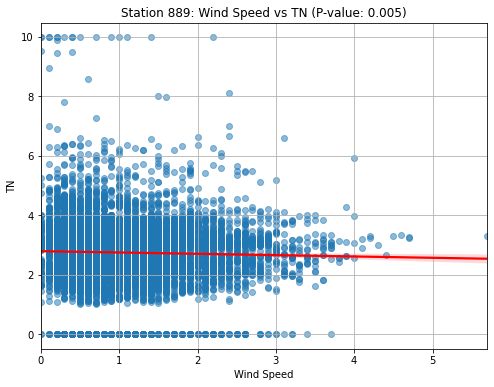

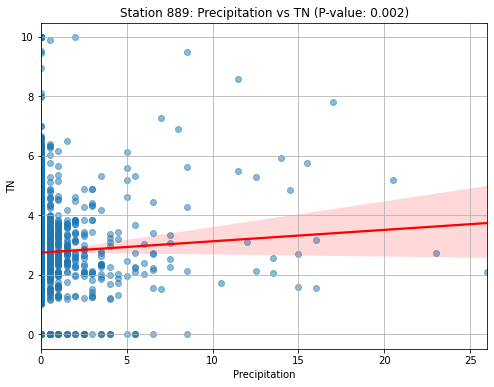

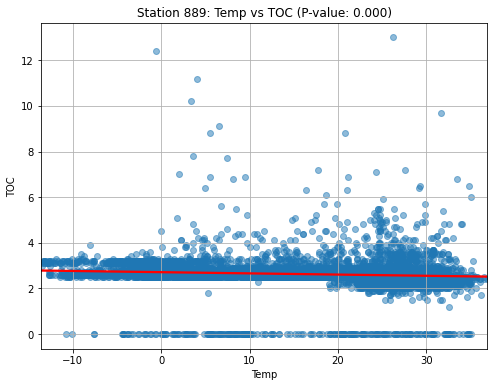

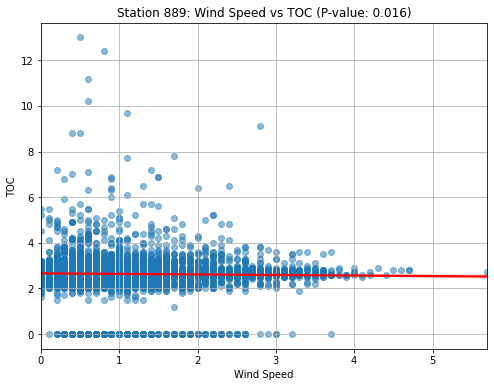

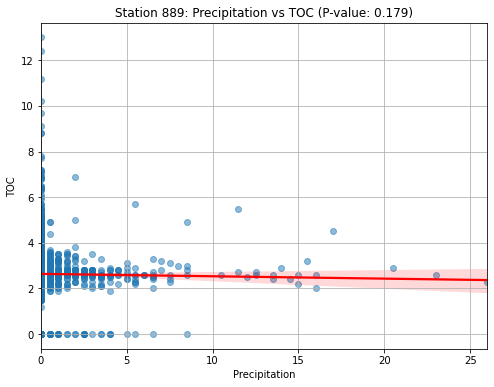

{'403': {('Temp', 'pH'): 2.1427015975924738e-32,
  ('Wind Speed', 'pH'): 0.73693081739499,
  ('Precipitation', 'pH'): 0.0007569771745152781,
  ('Temp', 'DO'): 6.871526217336832e-308,
  ('Wind Speed', 'DO'): 1.964547846128626e-18,
  ('Precipitation', 'DO'): 2.3212542767167538e-11,
  ('Temp', 'TN'): 0.0,
  ('Wind Speed', 'TN'): 0.00032364686802558666,
  ('Precipitation', 'TN'): 0.08593658601429223,
  ('Temp', 'TOC'): nan,
  ('Wind Speed', 'TOC'): nan,
  ('Precipitation', 'TOC'): nan},
 '408': {('Temp', 'pH'): 1.4495670047253983e-16,
  ('Wind Speed', 'pH'): 2.570942571132168e-07,
  ('Precipitation', 'pH'): 2.5877819355139203e-22,
  ('Temp', 'DO'): 0.0,
  ('Wind Speed', 'DO'): 1.1398050326165812e-19,
  ('Precipitation', 'DO'): 4.95426434294004e-32,
  ('Temp', 'TN'): 1.748753366905014e-106,
  ('Wind Speed', 'TN'): 3.944436849006152e-27,
  ('Precipitation', 'TN'): 0.0017568070578272616,
  ('Temp', 'TOC'): nan,
  ('Wind Speed', 'TOC'): nan,
  ('Precipitation', 'TOC'): nan},
 '423': {('Temp', 

In [12]:
independent_variables = ['Temp', 'Wind Speed', 'Precipitation'] 


p_value_results = {}

for file_path in file_paths:
    station_data = pd.read_excel(file_path)
    station_name = file_path.split('_')[-1].split('.')[0]
    
    p_values_for_station = {}
    
    for target in target_columns:
        for indep in independent_variables:
            X = station_data[[indep]]
            y = station_data[target]
            
           
            X = sm.add_constant(X)
            model = sm.OLS(y, X).fit()
            
           
            p_value = model.pvalues[1]
            p_values_for_station[(indep, target)] = p_value
            
        
            plt.figure(figsize=(8, 6))
            sns.regplot(x=indep, y=target, data=station_data, scatter_kws={'alpha': 0.5}, line_kws={'color': 'red'})
            plt.title(f'Station {station_name}: {indep} vs {target} (P-value: {p_value:.3f})')
            plt.xlabel(indep)
            plt.ylabel(target)
            plt.grid(True)
            plt.show()
    
    p_value_results[station_name] = p_values_for_station

p_value_results


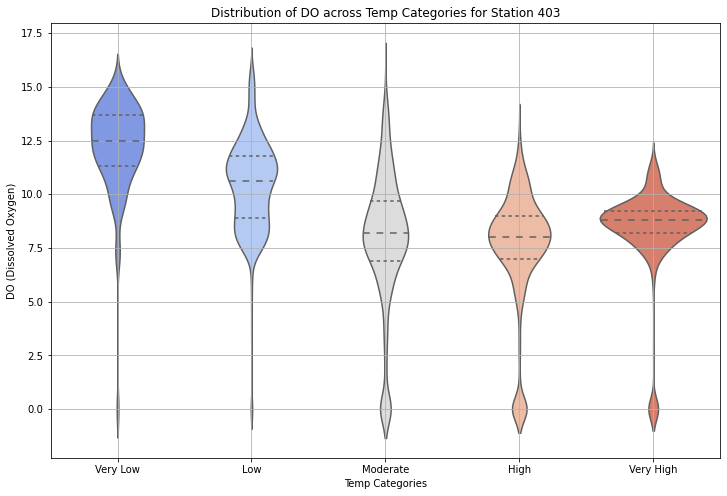

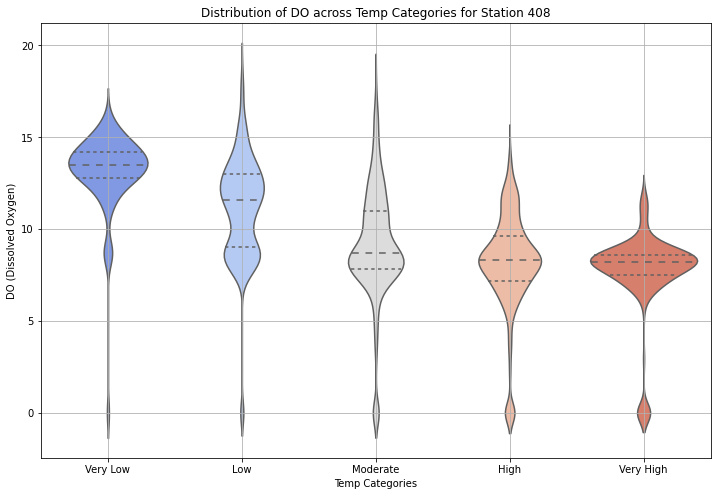

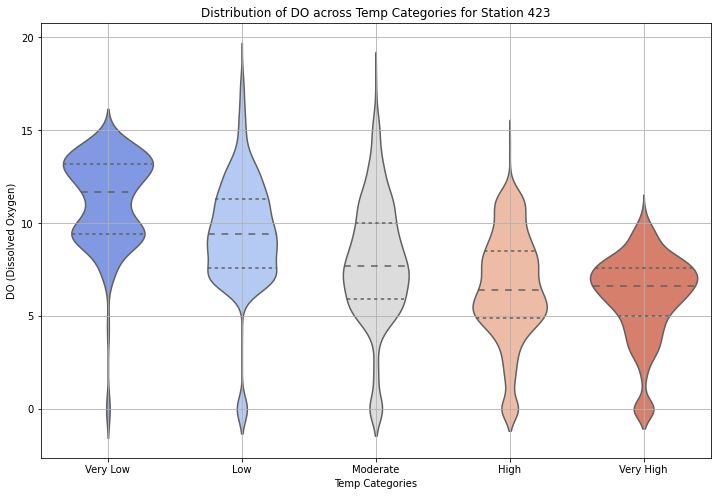

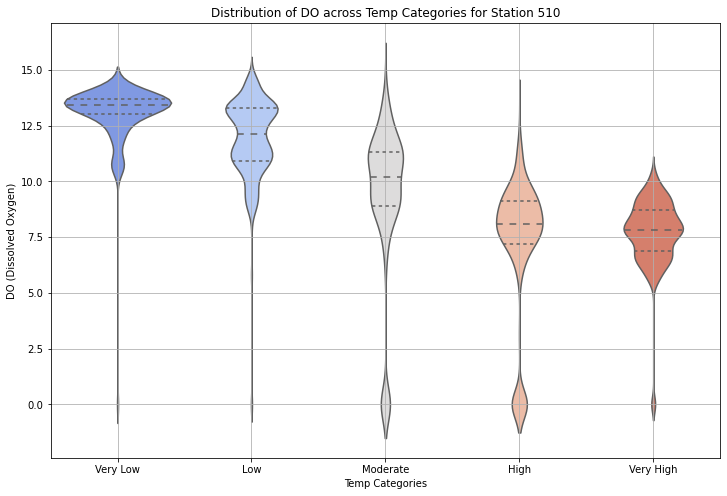

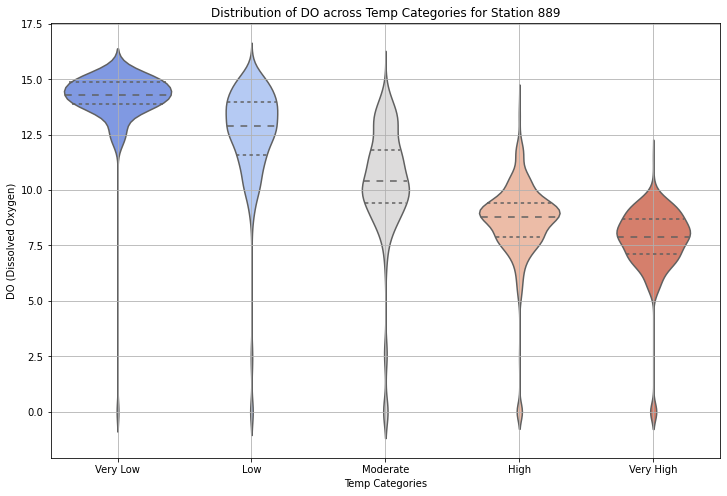

In [22]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

file_paths = [
    './English_Station_403.xlsx',
    './English_Station_408.xlsx',
    './English_Station_423.xlsx',
    './English_Station_510.xlsx',
    './English_Station_889.xlsx'
]

# 각 지역에 대해 바이올린 플롯 생성
for file_path in file_paths:
    # 데이터 로드
    station_data = pd.read_excel(file_path)
    
    # 지점명 추출
    station_name = file_path.split('_')[-1].split('.')[0]
    
    # 기온을 범주화
    station_data['Temp Category'] = pd.cut(station_data['Temp'], bins=5, labels=['Very Low', 'Low', 'Moderate', 'High', 'Very High'])
    
    # 바이올린 플롯 생성
    plt.figure(figsize=(12, 8))
    sns.violinplot(x='Temp Category', y='DO', data=station_data, palette='coolwarm', inner='quartile')
    plt.title(f'Distribution of DO across Temp Categories for Station {station_name}')
    plt.xlabel('Temp Categories')
    plt.ylabel('DO (Dissolved Oxygen)')
    plt.grid(True)
    plt.show()


/var/folders/m4/n8vl07s542z_c183fy2x0q_m0000gn/T/ipykernel_40821/3850342184.py:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='Wind Speed Category', y='DO', data=station_data, palette='coolwarm', inner='quartile')


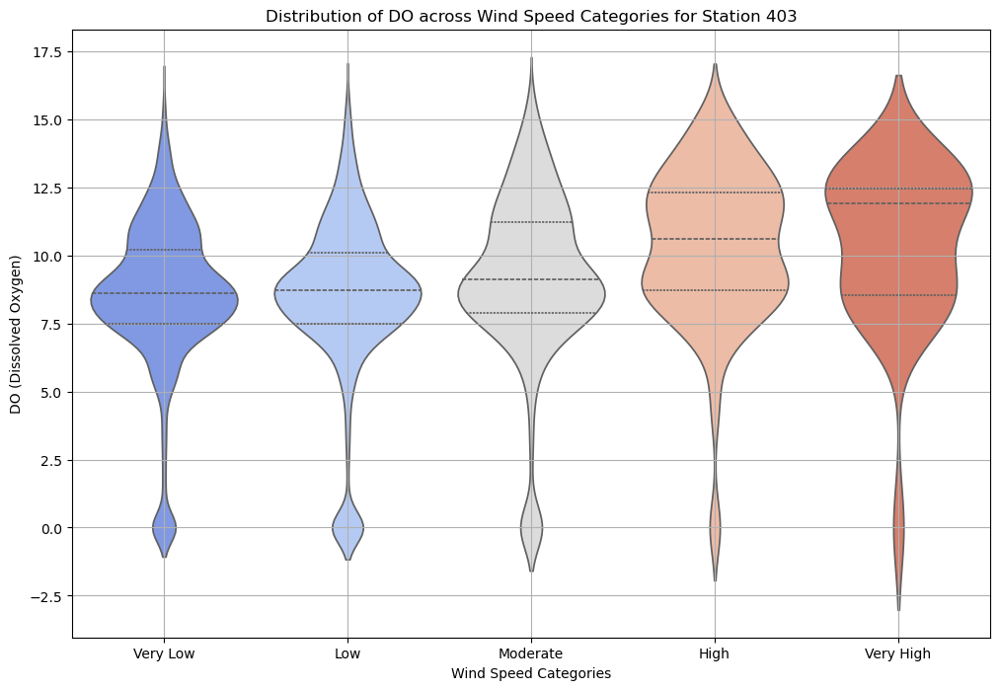

/var/folders/m4/n8vl07s542z_c183fy2x0q_m0000gn/T/ipykernel_40821/3850342184.py:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='Wind Speed Category', y='DO', data=station_data, palette='coolwarm', inner='quartile')


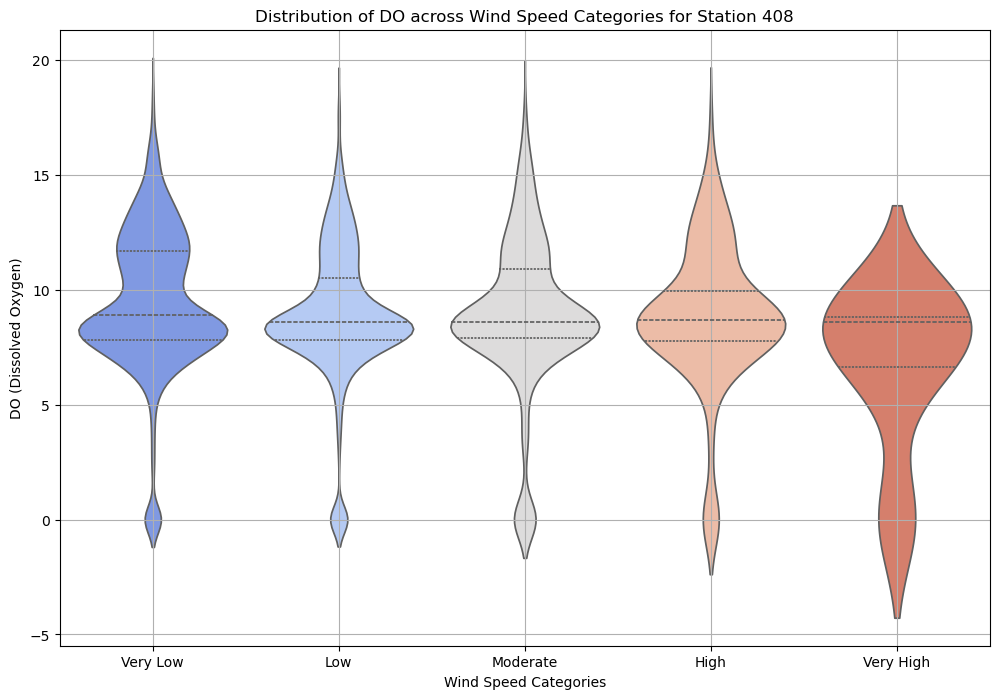

/var/folders/m4/n8vl07s542z_c183fy2x0q_m0000gn/T/ipykernel_40821/3850342184.py:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='Wind Speed Category', y='DO', data=station_data, palette='coolwarm', inner='quartile')


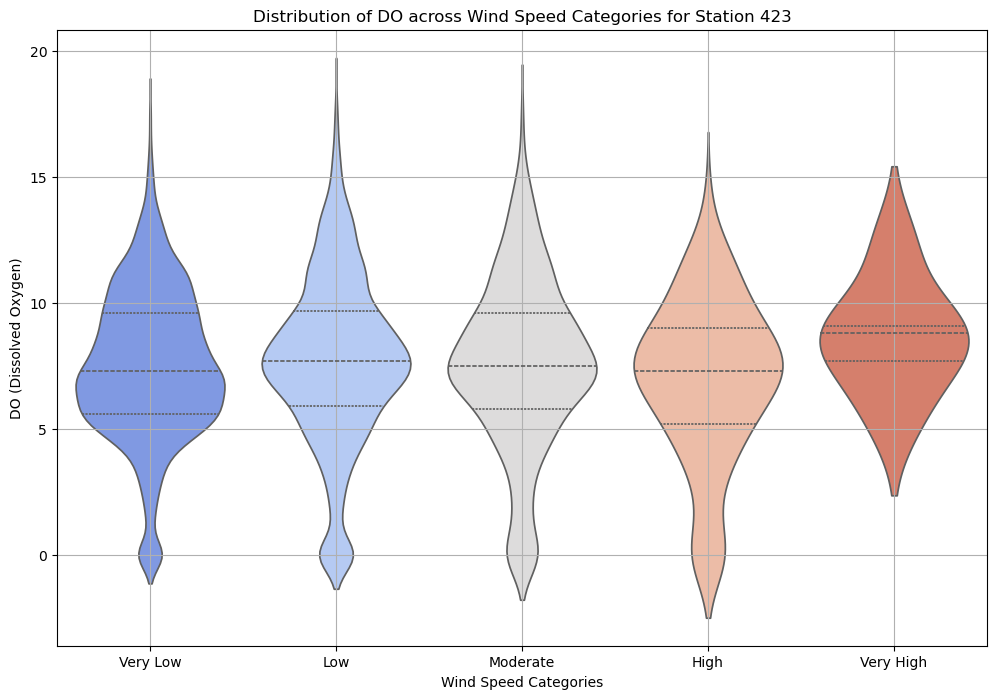

/var/folders/m4/n8vl07s542z_c183fy2x0q_m0000gn/T/ipykernel_40821/3850342184.py:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='Wind Speed Category', y='DO', data=station_data, palette='coolwarm', inner='quartile')


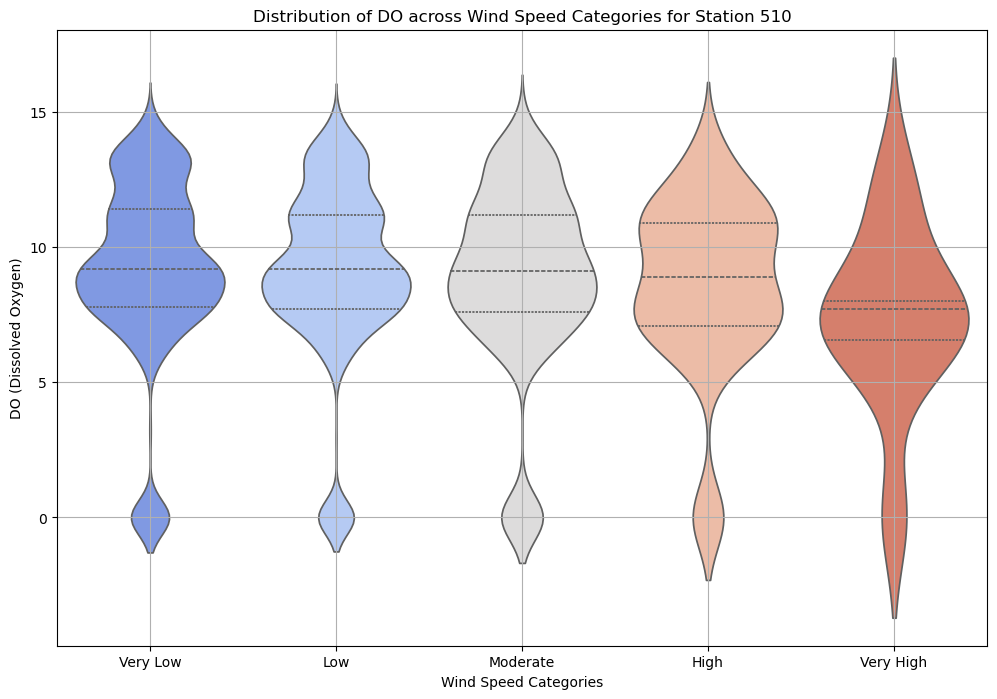

/var/folders/m4/n8vl07s542z_c183fy2x0q_m0000gn/T/ipykernel_40821/3850342184.py:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='Wind Speed Category', y='DO', data=station_data, palette='coolwarm', inner='quartile')


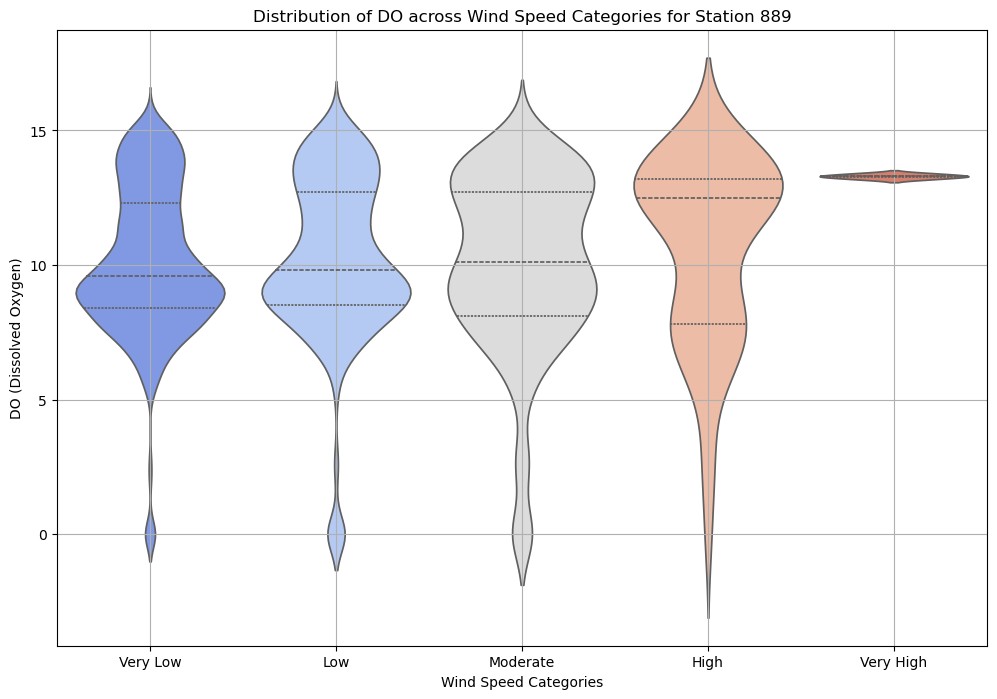

In [8]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# 모든 지점 데이터 파일 경로
file_paths = [
    './English_Station_403.xlsx',
    './English_Station_408.xlsx',
    './English_Station_423.xlsx',
    './English_Station_510.xlsx',
    './English_Station_889.xlsx'
]

# 각 지역에 대해 바이올린 플롯 생성
for file_path in file_paths:
    # 데이터 로드
    station_data = pd.read_excel(file_path)
    
    # 지점명 추출
    station_name = file_path.split('_')[-1].split('.')[0]
    
    # Wind Speed를 범주화
    station_data['Wind Speed Category'] = pd.cut(station_data['Wind Speed'], bins=5, labels=['Very Low', 'Low', 'Moderate', 'High', 'Very High'])
    
    # 바이올린 플롯 생성
    plt.figure(figsize=(12, 8))
    sns.violinplot(x='Wind Speed Category', y='DO', data=station_data, palette='coolwarm', inner='quartile')
    plt.title(f'Distribution of DO across Wind Speed Categories for Station {station_name}')
    plt.xlabel('Wind Speed Categories')
    plt.ylabel('DO (Dissolved Oxygen)')
    plt.grid(True)
    plt.show()


/var/folders/m4/n8vl07s542z_c183fy2x0q_m0000gn/T/ipykernel_40821/3374338302.py:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='Precipitation Category', y='DO', data=station_data, palette='coolwarm', inner='quartile')


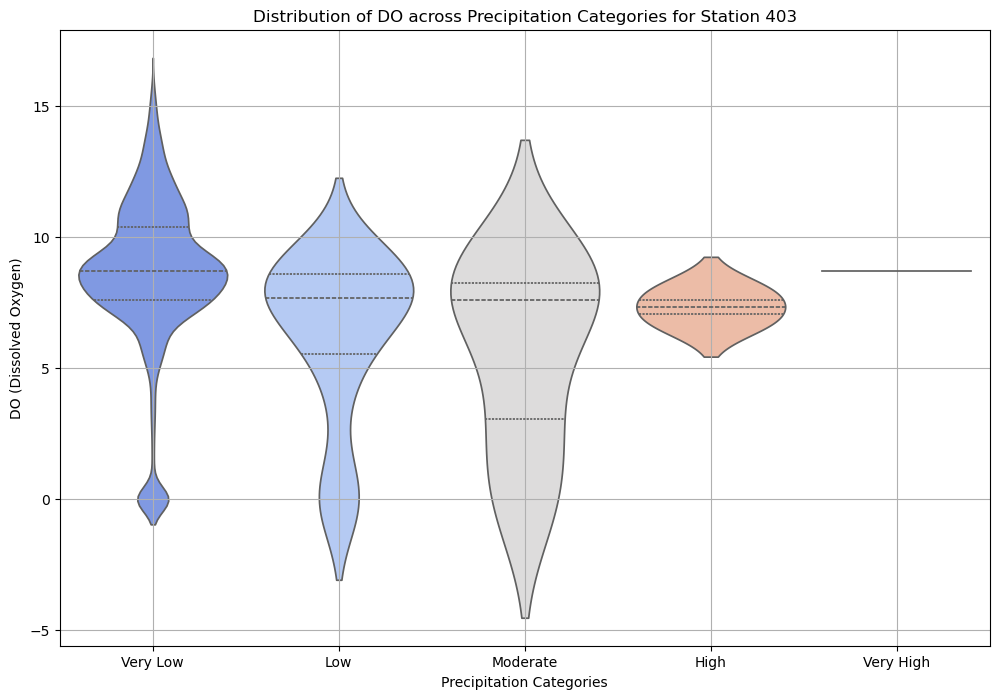

/var/folders/m4/n8vl07s542z_c183fy2x0q_m0000gn/T/ipykernel_40821/3374338302.py:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='Precipitation Category', y='DO', data=station_data, palette='coolwarm', inner='quartile')


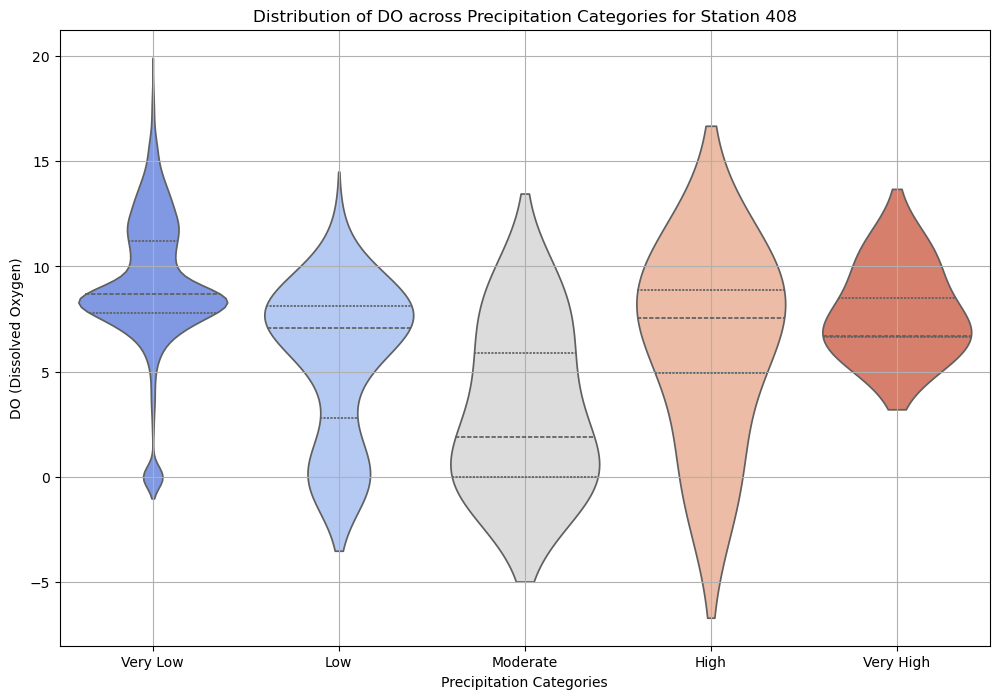

/var/folders/m4/n8vl07s542z_c183fy2x0q_m0000gn/T/ipykernel_40821/3374338302.py:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='Precipitation Category', y='DO', data=station_data, palette='coolwarm', inner='quartile')


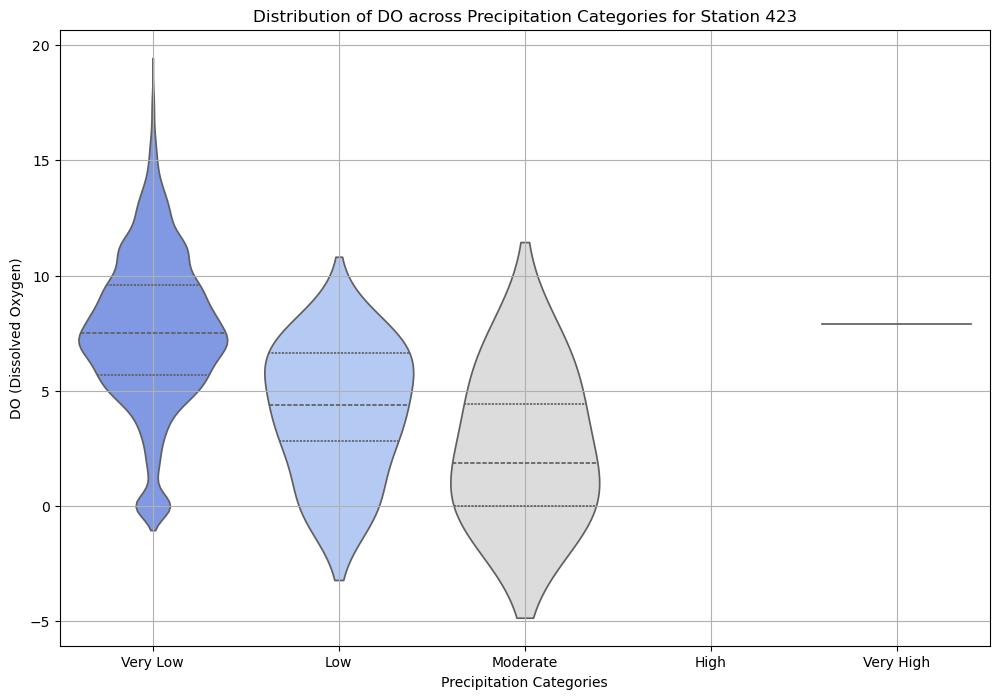

/var/folders/m4/n8vl07s542z_c183fy2x0q_m0000gn/T/ipykernel_40821/3374338302.py:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='Precipitation Category', y='DO', data=station_data, palette='coolwarm', inner='quartile')


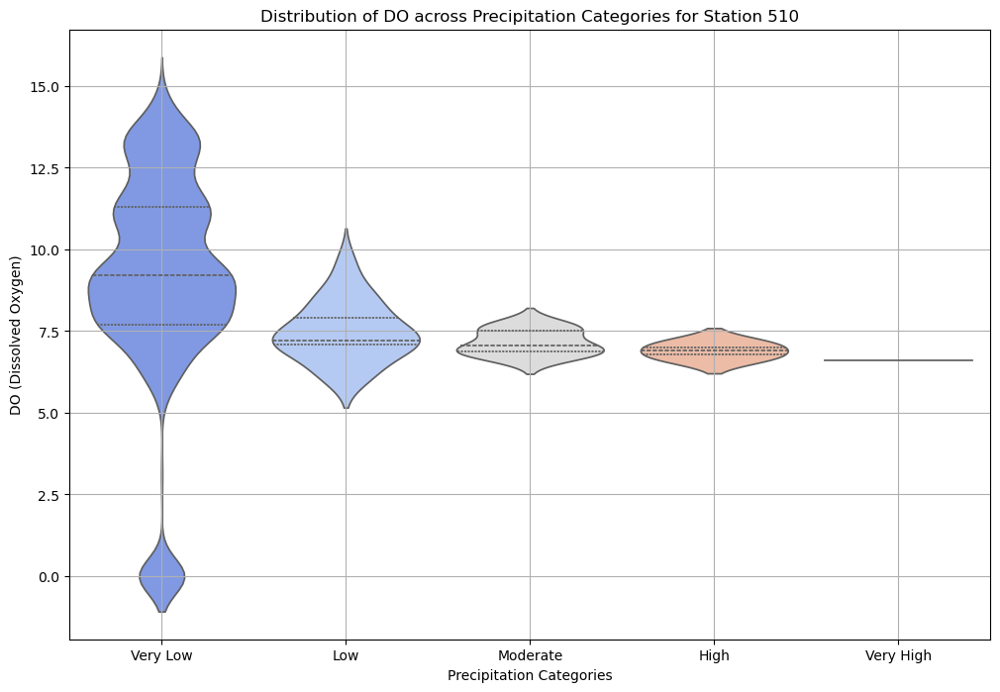

/var/folders/m4/n8vl07s542z_c183fy2x0q_m0000gn/T/ipykernel_40821/3374338302.py:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='Precipitation Category', y='DO', data=station_data, palette='coolwarm', inner='quartile')


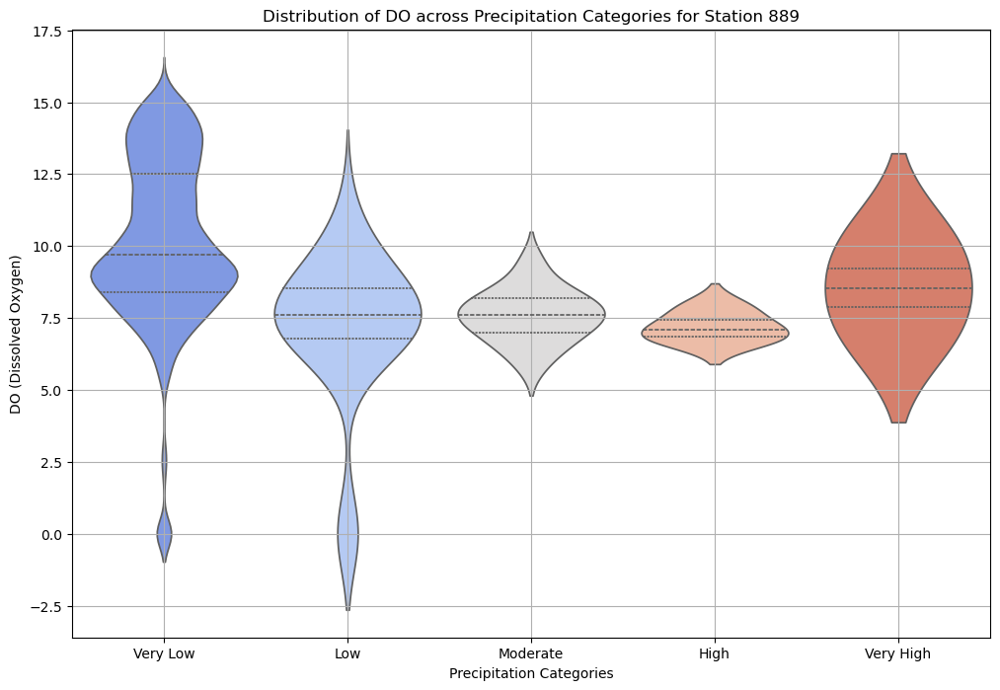

In [12]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# 모든 지점 데이터 파일 경로
file_paths = [
    './English_Station_403.xlsx',
    './English_Station_408.xlsx',
    './English_Station_423.xlsx',
    './English_Station_510.xlsx',
    './English_Station_889.xlsx'
]

# 각 지역에 대해 바이올린 플롯 생성
for file_path in file_paths:
    # 데이터 로드
    station_data = pd.read_excel(file_path)
    
    # 지점명 추출
    station_name = file_path.split('_')[-1].split('.')[0]
    
    # 강수량을 범주화
    station_data['Precipitation Category'] = pd.cut(station_data['Precipitation'], bins=5, labels=['Very Low', 'Low', 'Moderate', 'High', 'Very High'])
    
    # 바이올린 플롯 생성
    plt.figure(figsize=(12, 8))
    sns.violinplot(x='Precipitation Category', y='DO', data=station_data, palette='coolwarm', inner='quartile')
    plt.title(f'Distribution of DO across Precipitation Categories for Station {station_name}')
    plt.xlabel('Precipitation Categories')
    plt.ylabel('DO (Dissolved Oxygen)')
    plt.grid(True)
    plt.show()


In [7]:
#지도상 위치를 비교하기 위하여 지도 생성

import folium

# 서울의 중심(시청쯤)
map_center = [37.5665, 126.9780]

# 지도 객체
mymap = folium.Map(location=map_center, zoom_start=12)

# 각 지점 위치와 이름
locations =  [
    {"name": "노량진", "address": "서울특별시 동작구 본동 노량진취수장", "coords": [37.5123, 126.9403]},
    {"name": "선유도", "address": "서울특별시 영등포구 양화동 선유도 공원내", "coords": [37.5274, 126.8965]},
    {"name": "중량천", "address": "서울특별시 동대문구 휘경동 휘경빗물펌프장", "coords": [37.5740, 127.0573]},
    {"name": "탄천", "address": "서울특별시 송파구 가락동 탄천 빗물 펌프장", "coords": [37.4785, 127.1308]},
    {"name": "안양천", "address": "서울특별시 구로구 구로동 신구로 빗물 펌프장", "coords": [37.4957, 126.8763]}
]


for loc in locations:
    folium.Marker(
        location=loc["coords"],
        popup=folium.Popup(loc["name"], parse_html=True),
        icon=folium.Icon(color='blue')
    ).add_to(mymap)


mymap.save("River_locations_map.html")
